
### Dataset Overview:
- **Dataset Name**: happiness.csv
- **Data Type**: Multivariate, numeric (except for the "Country name" column).
- **Purpose**: The dataset captures various economic, social, and well-being factors for different countries over time. It could be used to model happiness or life satisfaction (Life Ladder) based on various socio-economic indicators.

### Columns:
1. **Country name**: Categorical variable (countries in the dataset).
2. **Year**: Numerical (year of data collection).
3. **Life Ladder**: Continuous variable (target variable often used to represent subjective well-being or happiness).
4. **Log GDP per capita**: Continuous variable (logarithmic transformation of GDP per capita to normalize economic data).
5. **Social support**: Continuous variable (level of social support individuals feel they have access to).
6. **Healthy life expectancy at birth**: Continuous variable (average number of years a newborn is expected to live in good health).
7. **Freedom to make life choices**: Continuous variable (subjective sense of freedom in life decision-making).
8. **Generosity**: Continuous variable (self-reported generosity or charitable giving).
9. **Perceptions of corruption**: Continuous variable (subjective sense of corruption within a society).
10. **Positive affect**: Continuous variable (frequency of positive emotions).
11. **Negative affect**: Continuous variable (frequency of negative emotions).

### Project Overview:
1. **Predictive Modeling**: Predicting the **Life Ladder** score based on the socio-economic indicators like GDP, life expectancy, freedom, social support, etc.
2. **Feature Importance Analysis**: Understanding which factors contribute the most to the happiness score.
3. **Exploratory Data Analysis (EDA)**: Investigating patterns and correlations in the data, such as the relationship between GDP and Life Ladder.



# A. Summarize the data. How much data is present? What attributes/features are continuous valued? Which attributes are categorical?

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

# Load the data
df = pd.read_csv('happiness_data.csv')
df.sample(5)

,Country name,year,Life Ladder,Log GDP per capita,Social support,Healthy life expectancy at birth,Freedom to make life choices,Generosity,Perceptions of corruption,Positive affect,Negative affect
387,Congo (Brazzaville),2019,5.213,8.101,0.625,58.50,0.686,-0.046,0.741,0.645,0.405
900,Kenya,2016,4.396,8.282,0.706,58.90,0.749,0.298,0.828,0.743,0.226
98,Azerbaijan,2011,4.680,9.540,0.725,63.64,0.537,-0.105,0.795,0.536,0.258
467,Djibouti,2011,4.369,7.880,0.633,54.70,0.746,-0.057,0.519,0.579,0.181
979,Lebanon,2017,5.154,9.681,0.777,66.60,0.605,-0.074,0.911,0.515,0.244


In [4]:
# Summarize data
print(f"Number of rows: {len(df)}")
print(f"Number of columns: {len(df.columns)}")

# Identify continuous and categorical columns
continuous_cols = df.select_dtypes(include=['float64', 'int64']).columns
categorical_cols = df.select_dtypes(include=['object']).columns

print("\nContinuous columns:")
print(continuous_cols)
print("\nCategorical columns:")
print(categorical_cols)

Number of rows: 1949
Number of columns: 11

Continuous columns:
Index(['year', 'Life Ladder', 'Log GDP per capita', 'Social support',
       'Healthy life expectancy at birth', 'Freedom to make life choices',
       'Generosity', 'Perceptions of corruption', 'Positive affect',
       'Negative affect'],
      dtype='object')

Categorical columns:
Index(['Country name'], dtype='object')


In [ ]:
# Display summary statistics
print(df.describe())

              year  Life Ladder  Log GDP per capita  Social support  \
count  1949.000000  1949.000000         1913.000000     1936.000000   
mean   2013.216008     5.466705            9.368453        0.812552   
std       4.166828     1.115711            1.154084        0.118482   
min    2005.000000     2.375000            6.635000        0.290000   
25%    2010.000000     4.640000            8.464000        0.749750   
50%    2013.000000     5.386000            9.460000        0.835500   
75%    2017.000000     6.283000           10.353000        0.905000   
max    2020.000000     8.019000           11.648000        0.987000   

       Healthy life expectancy at birth  Freedom to make life choices  \
count                       1894.000000                   1917.000000   
mean                          63.359374                      0.742558   
std                            7.510245                      0.142093   
min                           32.300000                      0.25800

In [5]:
# Missing Values/Null Values Count
df.isna().sum()
df.isnull().sum()

,0
Country name,0
year,0
Life Ladder,0
Log GDP per capita,36
Social support,13
Healthy life expectancy at birth,55
Freedom to make life choices,32
Generosity,89
Perceptions of corruption,110
Positive affect,22


In [6]:
# Check for outliers
def detect_outliers(df, col):
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = df[(df[col] < lower_bound) | (df[col] > upper_bound)]
    return len(outliers)

print("\nNumber of outliers:")
for col in continuous_cols:
    print(f"{col}: {detect_outliers(df, col)}")


Number of outliers:
year: 0
Life Ladder: 0
Log GDP per capita: 0
Social support: 43
Healthy life expectancy at birth: 15
Freedom to make life choices: 10
Generosity: 36
Perceptions of corruption: 164
Positive affect: 3
Negative affect: 29


### A.
Data Summary:
1. **Total Rows (Observations)**: 1,949
2. **Total Columns (Features)**: 11

#### Continuous Attributes:
- **year**
- **Life Ladder**
- **Log GDP per capita**
- **Social support**
- **Healthy life expectancy at birth**
- **Freedom to make life choices**
- **Generosity**
- **Perceptions of corruption**
- **Positive affect**
- **Negative affect**

#### Categorical Attributes:
- **Country name**

### Statistical Considerations:
- **Continuous variables**: Most columns are continuous, so regression models could be suitable for predictions.
- **Country name and year**: Could be used for grouping or time-series analysis, especially to study trends over time.

### Data Statistics:
- The dataset has a wide range of **years** (2005 to 2020), and the **Life Ladder** (happiness score) has a mean of 5.47, with a minimum value of 2.375 and a maximum of 8.019.
- The **Log GDP per capita** ranges from 6.635 to 11.648, with a mean of 9.37.
- **Social support** is well-supported, with an average of 0.813 and a high of 0.987.
- **Healthy life expectancy at birth** shows variability, with values from 32.3 to 77.1 years.
- **Freedom to make life choices** has a mean of 0.743, with a maximum of 0.985 and a minimum of 0.258.
- **Generosity** ranges from -0.335 to 0.698, while **Perceptions of corruption** has a mean of 0.747 and values ranging from 0.035 to 0.983.
- The emotional indicators **Positive affect** and **Negative affect** have means of 0.710 and 0.269, respectively.



# B. Display the statistical values for each of the attributes, along with visualizations (e.g., histogram) of the distributions for each attribute. Explain noticeable traits for key attributes. Are there any attributes that might require special treatment? If so, what special treatment might they require?

In [ ]:
# Display statistical summary for each attribute
print("Statistical Summary:")
summary = df.describe()
print(summary)

Statistical Summary:
              year  Life Ladder  Log GDP per capita  Social support  \
count  1949.000000  1949.000000         1913.000000     1936.000000   
mean   2013.216008     5.466705            9.368453        0.812552   
std       4.166828     1.115711            1.154084        0.118482   
min    2005.000000     2.375000            6.635000        0.290000   
25%    2010.000000     4.640000            8.464000        0.749750   
50%    2013.000000     5.386000            9.460000        0.835500   
75%    2017.000000     6.283000           10.353000        0.905000   
max    2020.000000     8.019000           11.648000        0.987000   

       Healthy life expectancy at birth  Freedom to make life choices  \
count                       1894.000000                   1917.000000   
mean                          63.359374                      0.742558   
std                            7.510245                      0.142093   
min                           32.300000        

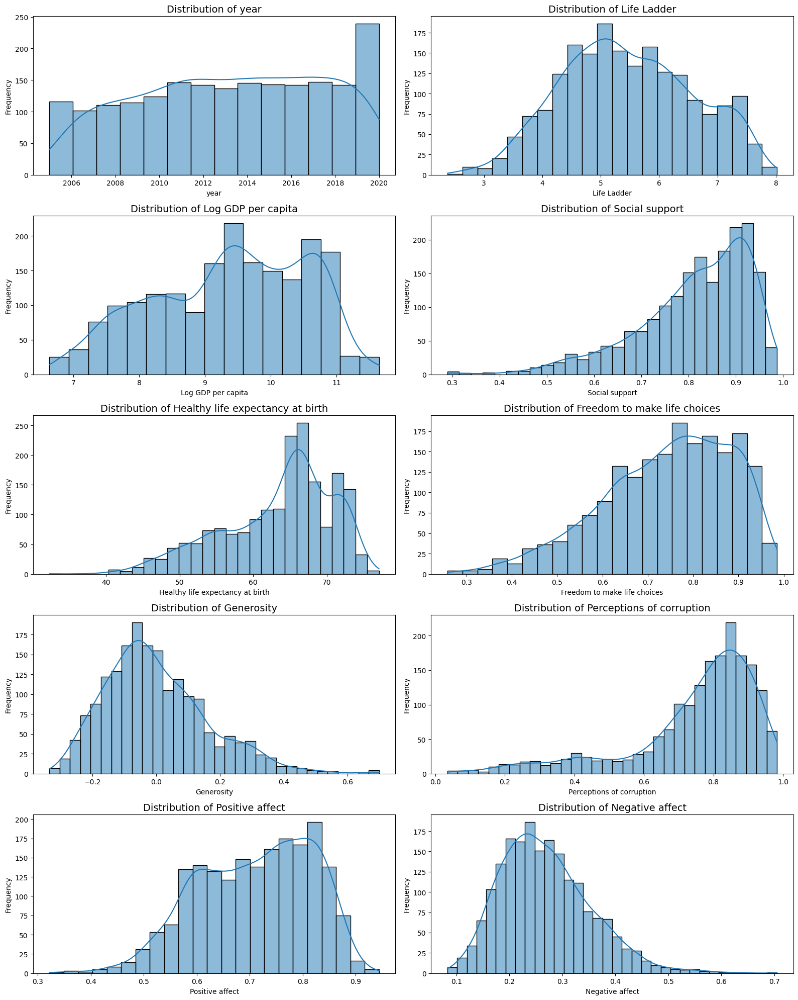

In [ ]:
#Distribution of each attribute

plt.figure(figsize=(16, 20))

continuous_columns = ['year', 'Life Ladder', 'Log GDP per capita', 'Social support',
                      'Healthy life expectancy at birth', 'Freedom to make life choices',
                      'Generosity', 'Perceptions of corruption', 'Positive affect', 'Negative affect']

for i, column in enumerate(continuous_columns, 1):
    plt.subplot(5, 2, i)
    sns.histplot(df[column].dropna(), kde=True)
    plt.title(f'Distribution of {column}', fontsize=14)
    plt.xlabel(column)
    plt.ylabel('Frequency')

plt.tight_layout()
plt.show()


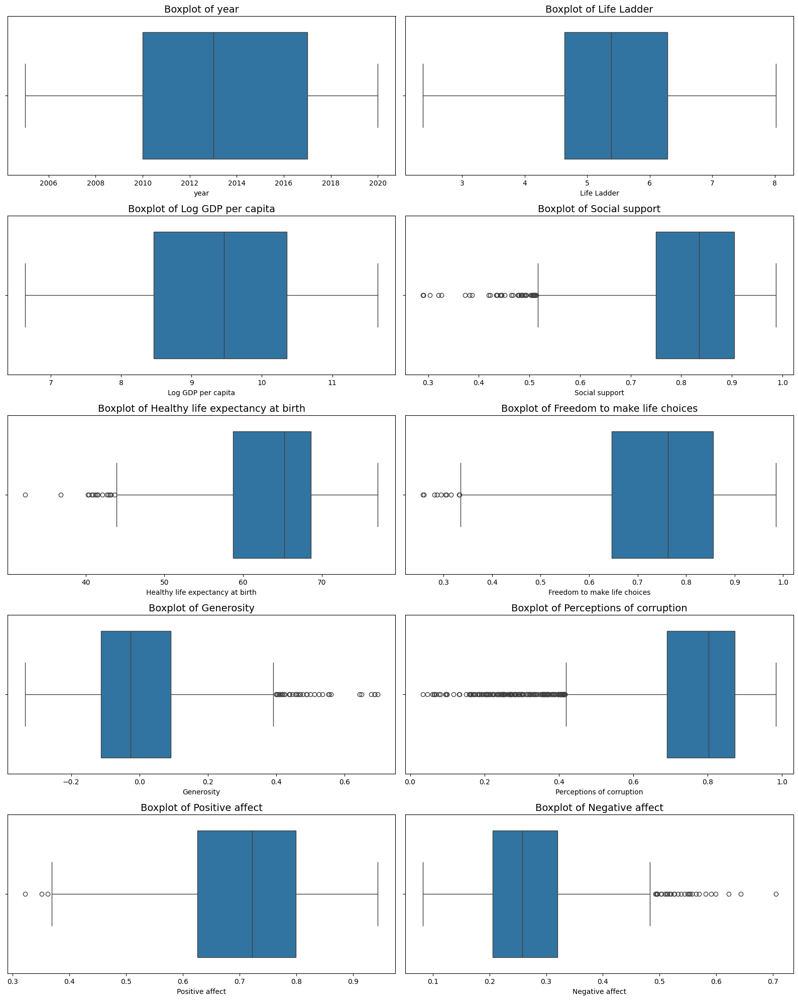

In [ ]:
# Visualizing outliers with Boxplots
plt.figure(figsize=(16, 20))

for i, column in enumerate(continuous_columns, 1):
    plt.subplot(5, 2, i)
    sns.boxplot(x=df[column])
    plt.title(f'Boxplot of {column}', fontsize=14)
    plt.xlabel(column)

plt.tight_layout()
plt.show()


In [ ]:
# Check for missing values
print("\nMissing Values:")
missing_values = df.isnull().sum()
print(missing_values)



Missing Values:
Country name                          0
year                                  0
Life Ladder                           0
Log GDP per capita                   36
Social support                       13
Healthy life expectancy at birth     55
Freedom to make life choices         32
Generosity                           89
Perceptions of corruption           110
Positive affect                      22
Negative affect                      16
dtype: int64


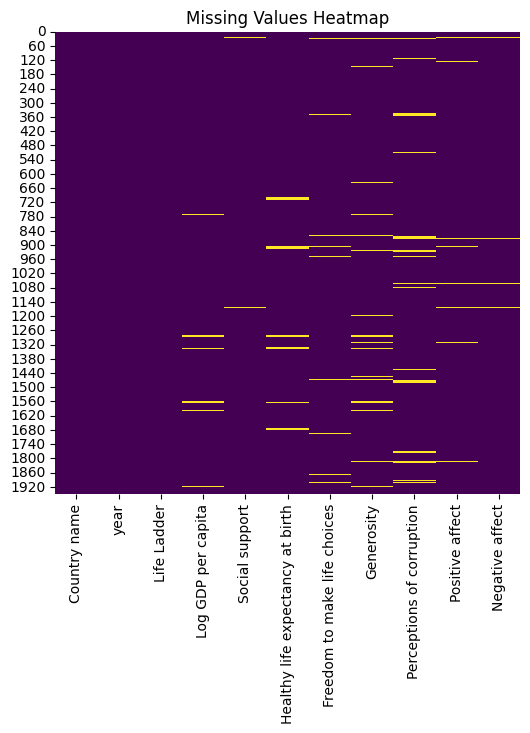

In [ ]:
# Visualize missing values with a heatmap
plt.figure(figsize=(6, 6))
sns.heatmap(df.isnull(), cbar=False, cmap='viridis')
plt.title('Missing Values Heatmap')
plt.show()

In [ ]:
## Identify skewness
for column in continuous_columns:
    skewness = df[column].skew()
    kurt = df[column].kurtosis()
    print(f"\n{column} - Skewness: {skewness}, Kurtosis: {kurt}")


year - Skewness: -0.128238326674531, Kurtosis: -1.0776741485722003

Life Ladder - Skewness: 0.0684831797859023, Kurtosis: -0.6886068660775093

Log GDP per capita - Skewness: -0.30845255865024496, Kurtosis: -0.8636224081948329

Social support - Skewness: -1.110682140580586, Kurtosis: 1.1844507119746197

Healthy life expectancy at birth - Skewness: -0.7444258022785646, Kurtosis: -0.05323508776088115

Freedom to make life choices - Skewness: -0.6230188679041034, Kurtosis: -0.1263983456403861

Generosity - Skewness: 0.8071402481021066, Kurtosis: 0.8408832191926745

Perceptions of corruption - Skewness: -1.496045365191314, Kurtosis: 1.8389011270478326

Positive affect - Skewness: -0.36419705052474194, Kurtosis: -0.5830554015001699

Negative affect - Skewness: 0.7371659338889655, Kurtosis: 0.868068564672225


In [ ]:
# Check for negative values in data
for column in continuous_columns:
    if (df[column] < 0).any():
      print(f"{column} has negative values; consider adjusting or re-evaluating its scale.")


Generosity has negative values; consider adjusting or re-evaluating its scale.


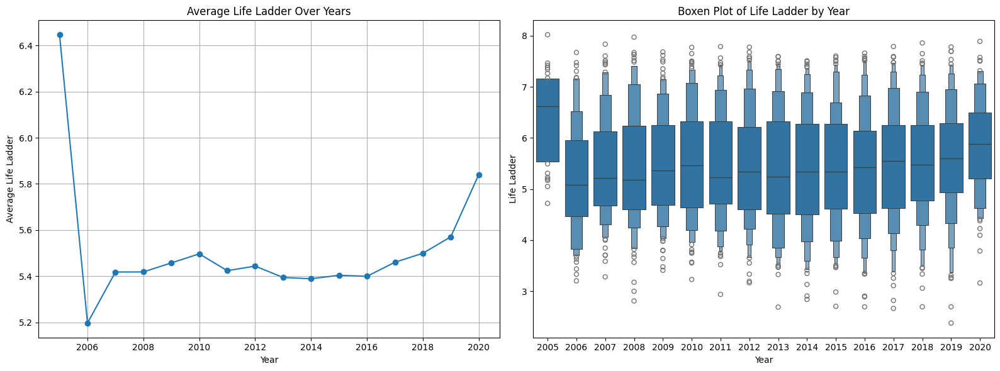

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Plot 1: Average Life Ladder Over Years
df.groupby('year')['Life Ladder'].mean().plot(ax=axes[0], marker='o')
axes[0].set_title('Average Life Ladder Over Years')
axes[0].set_xlabel('Year')
axes[0].set_ylabel('Average Life Ladder')
axes[0].grid()

# Plot 2: Boxen Plot of Life Ladder by Year
sns.boxenplot(x='year', y='Life Ladder', data=df, ax=axes[1])
axes[1].set_title('Boxen Plot of Life Ladder by Year')
axes[1].set_xlabel('Year')
axes[1].set_ylabel('Life Ladder')

plt.tight_layout()
plt.show()


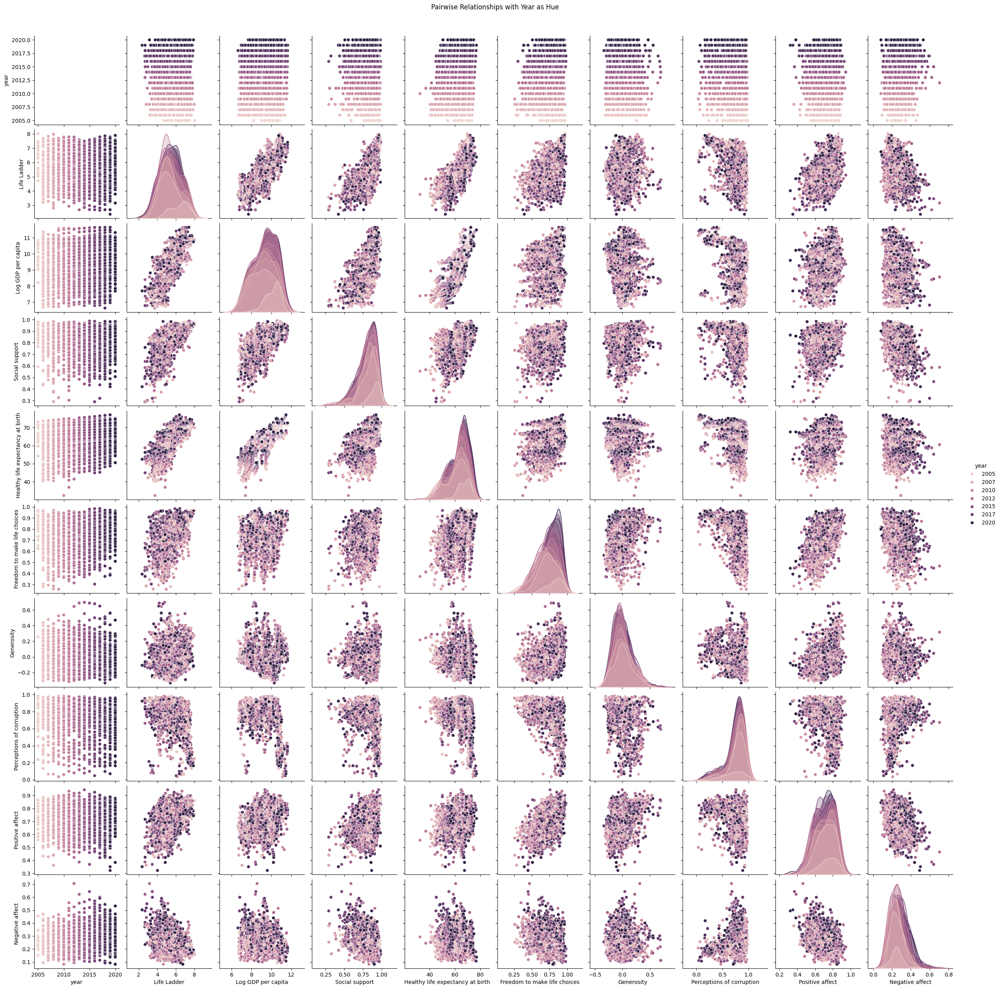

In [ ]:
sns.pairplot(df, hue='year', vars=continuous_columns)
plt.suptitle("Pairwise Relationships with Year as Hue", y=1.02)
plt.show()


#B. Answer :

### Statistical Values Summary

1. **Attributes**:
   - **Life Ladder**:
     - **Mean**: 5.47; **Std**: 1.12
     - **Skewness**: 0.068 (approximately symmetrical)
     - **Kurtosis**: -0.69 (light tails; less outlier-prone)
     - Distribution appears to be fairly uniform based on the skewness value.
   - **Log GDP per capita**:
     - **Mean**: 9.37; **Std**: 1.15
     - **Skewness**: -0.308 (slightly negatively skewed)
     - Distribution is somewhat balanced, indicating reasonable wealth across countries.
   - **Social Support**:
     - **Mean**: 0.81; **Std**: 0.12
     - **Skewness**: -1.11 (negatively skewed)
     - Indicates that many countries have lower social support, possibly highlighting inequality.
   - **Healthy Life Expectancy at Birth**:
     - **Mean**: 63.36; **Std**: 7.51
     - **Skewness**: -0.74 (negatively skewed)
     - A lot of countries have lower life expectancies, emphasizing health disparities.
   - **Freedom to Make Life Choices**:
     - **Mean**: 0.74; **Std**: 0.14
     - **Skewness**: -0.62 (negatively skewed)
     - Suggests limited freedom in many regions, potentially impacting well-being.
   - **Generosity**:
     - **Mean**: 0.0001; **Std**: 0.16
     - **Skewness**: 0.81 (positively skewed)
     - **Noticeable Trait**: The presence of negative values indicates some countries may have less inclination toward generosity.
     - **Special Treatment**: Consider adjusting the scale or normalizing the values.
   - **Perceptions of Corruption**:
     - **Mean**: 0.75; **Std**: 0.19
     - **Skewness**: -1.50 (strongly negatively skewed)
     - Many countries perceive higher levels of corruption.
   - **Positive and Negative Affect**:
     - **Positive Affect Mean**: 0.71; **Negative Affect Mean**: 0.27
     - Positive affect has a relatively higher average than negative affect, suggesting that, on average, people feel more positive emotions.

### Visualizations

1. **Histograms**:
   - Histograms for all continuous attributes show the distribution and frequency of values for each attribute.
   - For example, the histogram for **Life Ladder** showed the concentration of countries scoring at various levels of life satisfaction.

2. **Boxen Plot**:
   - This plot highlighted outliers and provided a clear picture of the distribution, central tendency, and variability for attributes like **Life Ladder** across years.

### Special Treatments

1. **Missing Values**:
   - Several attributes contain missing values (e.g., Log GDP per capita: 36 missing). Considerations:
     - Imputation (e.g., filling missing values with the mean, median, or using a predictive model).
     - Removing records with significant missing data if appropriate.

2. **Negative Values in Generosity**:
   - The presence of negative values suggests that some countries may report lower than average generosity. Considerations:
     - Transforming the data (e.g., shifting the distribution so that all values are positive).
     - Normalization or scaling to ensure comparability and interpretability.

3. **Skewness and Kurtosis Adjustments**:
   - Attributes like **Social Support** and **Perceptions of Corruption** are negatively skewed and may require transformation (e.g., log transformation) to normalize their distributions before applying machine learning algorithms.

#C. Analyze the relationships between the data attributes, and between the data attributes and label. This involves computing the Pearson Correlation Coefficient (PCC) and generating scatter plots.

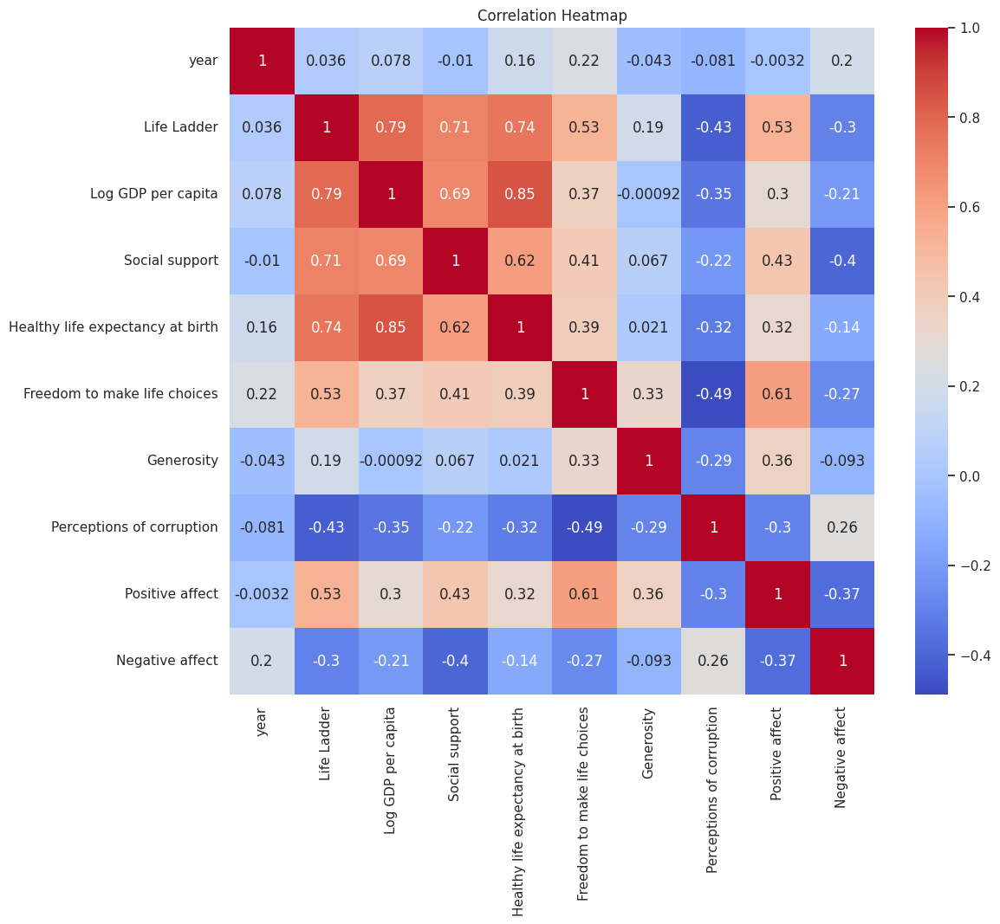

In [ ]:
# Compute correlation matrix
corr = df[continuous_cols].corr()

# Plot heatmap
plt.figure(figsize=(12,10))
sns.heatmap(corr, annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()


In [ ]:
# Compute Pearson Correlation Coefficient
df.corr(method='pearson', numeric_only=True)

,year,Life Ladder,Log GDP per capita,Social support,Healthy life expectancy at birth,Freedom to make life choices,Generosity,Perceptions of corruption,Positive affect,Negative affect
year,1.000000,0.035515,0.078246,-0.010093,0.164059,0.222151,-0.043422,-0.081478,-0.003245,0.196869
Life Ladder,0.035515,1.000000,0.790166,0.707806,0.744506,0.528063,0.190632,-0.427245,0.532273,-0.297488
Log GDP per capita,0.078246,0.790166,1.000000,0.692602,0.848049,0.367932,-0.000915,-0.345511,0.302282,-0.210781
Social support,-0.010093,0.707806,0.692602,1.000000,0.616037,0.410402,0.067000,-0.219040,0.432152,-0.395865
Healthy life expectancy at birth,0.164059,0.744506,0.848049,0.616037,1.000000,0.388681,0.020737,-0.322461,0.318247,-0.139477
Freedom to make life choices,0.222151,0.528063,0.367932,0.410402,0.388681,1.000000,0.329300,-0.487883,0.606114,-0.267661
Generosity,-0.043422,0.190632,-0.000915,0.067000,0.020737,0.329300,1.000000,-0.290706,0.358006,-0.092542
Perceptions of corruption,-0.081478,-0.427245,-0.345511,-0.219040,-0.322461,-0.487883,-0.290706,1.000000,-0.296517,0.264225
Positive affect,-0.003245,0.532273,0.302282,0.432152,0.318247,0.606114,0.358006,-0.296517,1.000000,-0.374439
Negative affect,0.196869,-0.297488,-0.210781,-0.395865,-0.139477,-0.267661,-0.092542,0.264225,-0.374439,1.000000


### The Correlation Matrix:

1. **Life Ladder (Well-Being)**:
   - Strong positive correlations with:
     - **Log GDP per capita** (0.79): Higher GDP is associated with higher life satisfaction.
     - **Social support** (0.71): More social support correlates with greater happiness.
     - **Healthy life expectancy** (0.74): Healthier populations report higher satisfaction.
   - Moderate correlations with:
     - **Freedom to make life choices** (0.53): More freedoms lead to greater happiness.
     - **Positive affect** (0.53): More positive emotions are linked to higher life satisfaction.
   - Negative correlation with **Perceptions of corruption** (-0.43): Higher corruption perceptions relate to lower happiness.


### Key Insights
- Economic factors, health, and social support are strongly related to perceived happiness.
- Improving governance and social conditions may enhance overall well-being.
- Generosity and negative emotions require further exploration to understand their roles in happiness.

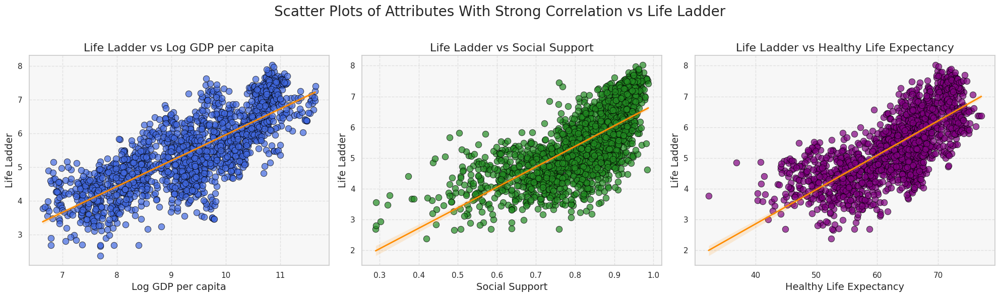

In [ ]:
#Scatterplots for Strong positive correlations [Log GDP per capita (0.79), Log GDP per capita (0.79), Healthy life expectancy (0.74)]

import matplotlib.pyplot as plt
import seaborn as sns

sns.set(style="whitegrid")

fig, axs = plt.subplots(1, 3, figsize=(20, 6))
fig.suptitle('Scatter Plots of Attributes With Strong Correlation vs Life Ladder', fontsize=20)

# Scatter plot for Log GDP per capita
sns.scatterplot(x='Log GDP per capita', y='Life Ladder', data=df, ax=axs[0],
                color='royalblue', s=80, edgecolor='black', alpha=0.7)
sns.regplot(x='Log GDP per capita', y='Life Ladder', data=df, ax=axs[0],
            scatter=False, color='darkorange', line_kws={"linewidth":2})

axs[0].set_title('Life Ladder vs Log GDP per capita', fontsize=16)
axs[0].set_xlabel('Log GDP per capita', fontsize=14)
axs[0].set_ylabel('Life Ladder', fontsize=14)

# Scatter plot for Social support
sns.scatterplot(x='Social support', y='Life Ladder', data=df, ax=axs[1],
                color='forestgreen', s=80, edgecolor='black', alpha=0.7)
sns.regplot(x='Social support', y='Life Ladder', data=df, ax=axs[1],
            scatter=False, color='darkorange', line_kws={"linewidth":2})

axs[1].set_title('Life Ladder vs Social Support', fontsize=16)
axs[1].set_xlabel('Social Support', fontsize=14)
axs[1].set_ylabel('Life Ladder', fontsize=14)

# Scatter plot for Healthy life expectancy at birth
sns.scatterplot(x='Healthy life expectancy at birth', y='Life Ladder', data=df, ax=axs[2],
                color='purple', s=80, edgecolor='black', alpha=0.7)
sns.regplot(x='Healthy life expectancy at birth', y='Life Ladder', data=df, ax=axs[2],
            scatter=False, color='darkorange', line_kws={"linewidth":2})

axs[2].set_title('Life Ladder vs Healthy Life Expectancy', fontsize=16)
axs[2].set_xlabel('Healthy Life Expectancy', fontsize=14)
axs[2].set_ylabel('Life Ladder', fontsize=14)

for ax in axs:
    ax.grid(True, linestyle='--', alpha=0.5)
    ax.set_facecolor('#f7f7f7')

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


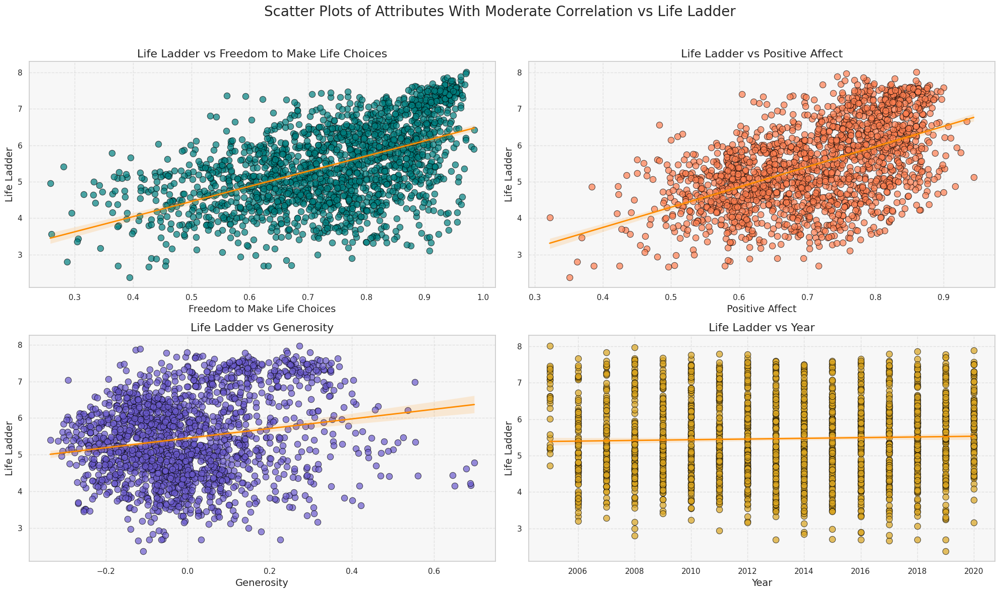

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

sns.set(style="whitegrid")

fig, axs = plt.subplots(2, 2, figsize=(20, 12))
fig.suptitle('Scatter Plots of Attributes With Moderate Correlation vs Life Ladder', fontsize=20)

sns.scatterplot(x='Freedom to make life choices', y='Life Ladder', data=df, ax=axs[0, 0],
                color='teal', s=80, edgecolor='black', alpha=0.7)
sns.regplot(x='Freedom to make life choices', y='Life Ladder', data=df, ax=axs[0, 0],
            scatter=False, color='darkorange', line_kws={"linewidth":2})

axs[0, 0].set_title('Life Ladder vs Freedom to Make Life Choices', fontsize=16)
axs[0, 0].set_xlabel('Freedom to Make Life Choices', fontsize=14)
axs[0, 0].set_ylabel('Life Ladder', fontsize=14)

# Scatter plot for Positive affect
sns.scatterplot(x='Positive affect', y='Life Ladder', data=df, ax=axs[0, 1],
                color='coral', s=80, edgecolor='black', alpha=0.7)
sns.regplot(x='Positive affect', y='Life Ladder', data=df, ax=axs[0, 1],
            scatter=False, color='darkorange', line_kws={"linewidth":2})

axs[0, 1].set_title('Life Ladder vs Positive Affect', fontsize=16)
axs[0, 1].set_xlabel('Positive Affect', fontsize=14)
axs[0, 1].set_ylabel('Life Ladder', fontsize=14)

# Scatter plot for Generosity
sns.scatterplot(x='Generosity', y='Life Ladder', data=df, ax=axs[1, 0],
                color='slateblue', s=80, edgecolor='black', alpha=0.7)
sns.regplot(x='Generosity', y='Life Ladder', data=df, ax=axs[1, 0],
            scatter=False, color='darkorange', line_kws={"linewidth":2})

axs[1, 0].set_title('Life Ladder vs Generosity', fontsize=16)
axs[1, 0].set_xlabel('Generosity', fontsize=14)
axs[1, 0].set_ylabel('Life Ladder', fontsize=14)

# Scatter plot for Year
sns.scatterplot(x='year', y='Life Ladder', data=df, ax=axs[1, 1],
                color='goldenrod', s=80, edgecolor='black', alpha=0.7)
sns.regplot(x='year', y='Life Ladder', data=df, ax=axs[1, 1],
            scatter=False, color='darkorange', line_kws={"linewidth":2})

axs[1, 1].set_title('Life Ladder vs Year', fontsize=16)
axs[1, 1].set_xlabel('Year', fontsize=14)
axs[1, 1].set_ylabel('Life Ladder', fontsize=14)

for ax in axs.flatten():
    ax.grid(True, linestyle='--', alpha=0.5)
    ax.set_facecolor('#f7f7f7')

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


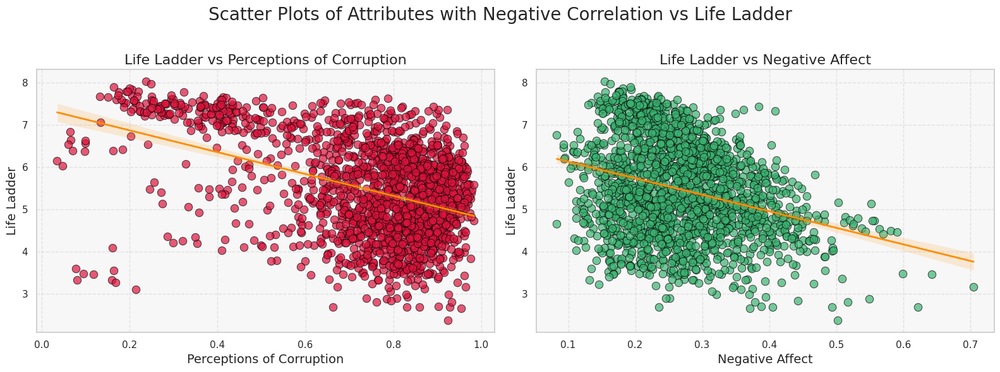

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

sns.set(style="whitegrid")

fig, axs = plt.subplots(1, 2, figsize=(16, 6))
fig.suptitle('Scatter Plots of Attributes with Negative Correlation vs Life Ladder', fontsize=20)

# Scatter plot for Perceptions of corruption
sns.scatterplot(x='Perceptions of corruption', y='Life Ladder', data=df, ax=axs[0],
                color='crimson', s=80, edgecolor='black', alpha=0.7)
sns.regplot(x='Perceptions of corruption', y='Life Ladder', data=df, ax=axs[0],
            scatter=False, color='darkorange', line_kws={"linewidth":2})

axs[0].set_title('Life Ladder vs Perceptions of Corruption', fontsize=16)
axs[0].set_xlabel('Perceptions of Corruption', fontsize=14)
axs[0].set_ylabel('Life Ladder', fontsize=14)

# Scatter plot for Negative affect
sns.scatterplot(x='Negative affect', y='Life Ladder', data=df, ax=axs[1],
                color='mediumseagreen', s=80, edgecolor='black', alpha=0.7)
sns.regplot(x='Negative affect', y='Life Ladder', data=df, ax=axs[1],
            scatter=False, color='darkorange', line_kws={"linewidth":2})

axs[1].set_title('Life Ladder vs Negative Affect', fontsize=16)
axs[1].set_xlabel('Negative Affect', fontsize=14)
axs[1].set_ylabel('Life Ladder', fontsize=14)

for ax in axs:
    ax.grid(True, linestyle='--', alpha=0.5)
    ax.set_facecolor('#f7f7f7')

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


#C. Answer:

### While we have already discussed the key insights from the correlation matrix above, some of the other insights based on the scatterplots and overall are:

### 1. **Generosity**:
   - While **Generosity** shows a positive correlation with **Life Ladder** (0.19), its distribution could affect model performance because it has negative values.
     - **Action**: We can consider applying a transformation to adjust its scale (e.g., taking the absolute value, normalizing, or standardizing) if it negatively affects modeling.

### 2. **Addressing Negative Affect and Perceptions of Corruption**:
   - The **Negative Affect** attribute has a moderate negative correlation with the **Life Ladder** (-0.30). Additionally, **Perceptions of Corruption** has a strong negative correlation (-0.43).
     - **Action**: We can consider transforming these features or creating new features that capture their influence on happiness more effectively, possibly through normalization or binning.

### 3. **Handling Multicollinearity**:
   - **Log GDP per capita, Social support, and Healthy life expectancy** are highly correlated with the **Life Ladder**.
     - **Action**: for multiple linear regression, can consider removing or combining these features to avoid multicollinearity issues, which can lead to unstable coefficient estimates.

### 3. **Normalization/Standardization**:
   - Given that different attributes have different scales (e.g., **Log GDP per capita** vs. **Life Ladder**), normalizing or standardizing your features might be beneficial.
     - **Action**: Applying Min-Max scaling or Z-score normalization depending on the modeling technique.

### 4. **Imputation for Missing Values**:
   - Several features have missing values, particularly **Log GDP per capita**, **Social support**, and others.
     - **Action**: Decide on an imputation strategy (mean, median, mode, or using a predictive model) to handle these missing values to avoid losing data and ensure robust analyses.

***Some necessary Preprocessing:***

In [7]:
#Handling missing values:
for col in continuous_cols:
    if df[col].isnull().sum() > 0:
        df[col].fillna(df[col].mean(), inplace=True)  # Mean imputation


In [8]:
missing_values = df.isnull().sum()
print(missing_values[missing_values > 0])


Series([], dtype: int64)


In [9]:
# Handle outliers through capping
import numpy as np
import pandas as pd

# Function to detect outliers
def detect_outliers(df, column):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return df[(df[column] < lower_bound) | (df[column] > upper_bound)].shape[0]

print("\nNumber of outliers:")
for col in continuous_cols:
    print(f"{col}: {detect_outliers(df, col)}")

for col in ['Log GDP per capita', 'Social support', 'Healthy life expectancy at birth', 'Freedom to make life choices']:
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1

    lower_bound = Q1 - 2.5 * IQR
    upper_bound = Q3 + 2.5 * IQR


    df[col] = np.where(df[col] > upper_bound, upper_bound, df[col])
    df[col] = np.where(df[col] < lower_bound, lower_bound, df[col])

print("\nNumber of outliers after capping:")
for col in continuous_cols:
    print(f"{col}: {detect_outliers(df, col)}")



Number of outliers:
year: 0
Life Ladder: 0
Log GDP per capita: 0
Social support: 45
Healthy life expectancy at birth: 23
Freedom to make life choices: 11
Generosity: 42
Perceptions of corruption: 189
Positive affect: 4
Negative affect: 29

Number of outliers after capping:
year: 0
Life Ladder: 0
Log GDP per capita: 0
Social support: 45
Healthy life expectancy at birth: 23
Freedom to make life choices: 11
Generosity: 42
Perceptions of corruption: 189
Positive affect: 4
Negative affect: 29


#D. Select 25% of the data for testing. Describe how you did that and verify that your test portion of the data is representative of the entire dataset.

In [10]:
from sklearn.model_selection import train_test_split

# Split data
X = df.drop(['Life Ladder', 'year', 'Country name'], axis=1)
y = df['Life Ladder']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

# Verify representativeness
print("Full dataset mean:", y.mean())
print("Test set mean:", y_test.mean())

print("\nFull dataset std:", y.std())
print("Test set std:", y_test.std())

Full dataset mean: 5.46670548999487
Test set mean: 5.494120901639345

Full dataset std: 1.1157105016473912
Test set std: 1.1118663572754932


In [11]:
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(1461, 8)
(488, 8)
(1461,)
(488,)


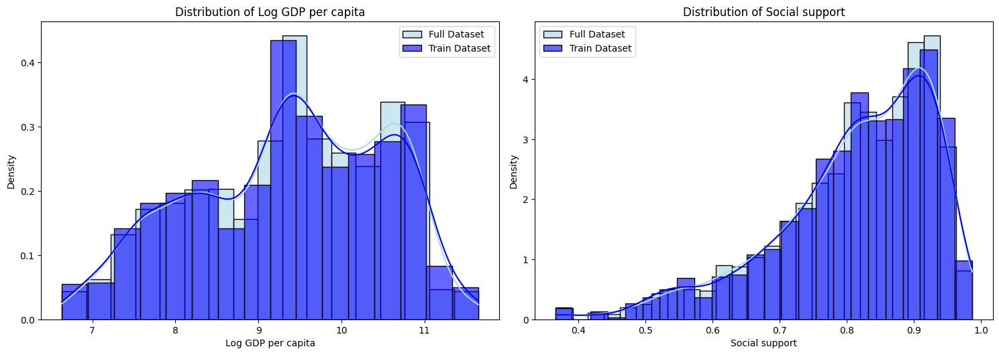

In [ ]:
#Verifying the split
key_columns = ['Log GDP per capita', 'Social support']

plt.figure(figsize=(15, 10))

for i, col in enumerate(key_columns, 1):
    plt.subplot(2, 2, i)
    sns.histplot(df[col], color='lightblue', label='Full Dataset', kde=True, stat='density', alpha=0.6)
    sns.histplot(X_train[col], color='blue', label='Train Dataset', kde=True, stat='density', alpha=0.6)
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Density')
    plt.legend()

plt.tight_layout()
plt.show()


#D. Answer:
### 1: Splitting the Data

We split the dataset into training and testing sets by randomly selecting 25% of the data for the test set. The remaining 75% was used for training. This random selection helps ensure that both datasets maintain the overall characteristics of the original dataset.

### 2: Verifying Representativeness

To verify that the test portion of the data is representative of the entire dataset, we calculated and compared the mean and standard deviation of the key attribute (Life Ladder) for both the full dataset and the test set.

- **Mean of Full Dataset**: 5.4667
- **Mean of Test Set**: 5.4941

- **Standard Deviation of Full Dataset**: 1.1157
- **Standard Deviation of Test Set**: 1.1119

### 3: Analysis

1. **Similar Means**:
   - The mean Life Ladder score for the full dataset (5.4667) and the test set (5.4941) are very close, indicating that the overall level of life satisfaction is similar across both datasets. This suggests that the test set captures the average sentiment present in the full dataset.

2. **Similar Standard Deviations**:
   - The standard deviation for the full dataset (1.1157) and the test set (1.1119) are also very close. This indicates that the variability in life satisfaction scores is consistent across both datasets. A similar spread of values suggests that the test set reflects the diversity of life satisfaction found in the full dataset.

3. **Visual Representation**:
   - The histogram and density plots for both the full dataset and the test set further confirmed this representativeness. The distributions overlap significantly, indicating that both datasets share similar characteristics.


#E. Train a Linear Regression model using the training data with three-fold cross-validation using appropriate evaluation metric. Do this with a closed-form solution (using the Normal Equation or SVD) and with SGD. Perform Ridge, Lasso and Elastic Net regularization – try three values of penalty term and describe its impact. Explore the impact of other hyperparameters, like batch size and learning rate (no need for grid search). Describe your findings. For SGD, display the training and validation loss as a function of training iteration.

#***Linear Regression***

In [12]:
def plot_model(x, y,model_name):
    sns.set(style='whitegrid')
    plt.scatter(x,y)
    plt.title(model_name,fontsize = 14)
    plt.xlabel("Actual Values",fontsize=12)
    plt.ylabel("Predicted Values",fontsize=12)

In [13]:
#Store results of all the models to get a summary at the end of the project
best_model={'Name':[],'MSE':[],'R2 score':[]}

Fold 1
Train MSE: 29.968484414258814, Val MSE: 30.615419830860347
Train MAE: 5.436886324091158, Val MAE: 5.498872115678054
Train RMSE: 5.474347852873327, Val RMSE: 5.533120261738429
Train R2: -23.242457846573522, Val R2: -23.119717809985463

Fold 2
Train MSE: 29.924518810442184, Val MSE: 30.650318656379294
Train MAE: 5.433610788432756, Val MAE: 5.50542318699486
Train RMSE: 5.470330777059298, Val RMSE: 5.5362729933032835
Train R2: -22.494677985115594, Val R2: -24.695502275725122

Fold 3
Train MSE: 30.128573099888047, Val MSE: 30.13922902401947
Train MAE: 5.4583231433997135, Val MAE: 5.455998477060944
Train RMSE: 5.488950090854174, Val RMSE: 5.489920675567132
Train R2: -23.461822989366176, Val R2: -22.583010433526148



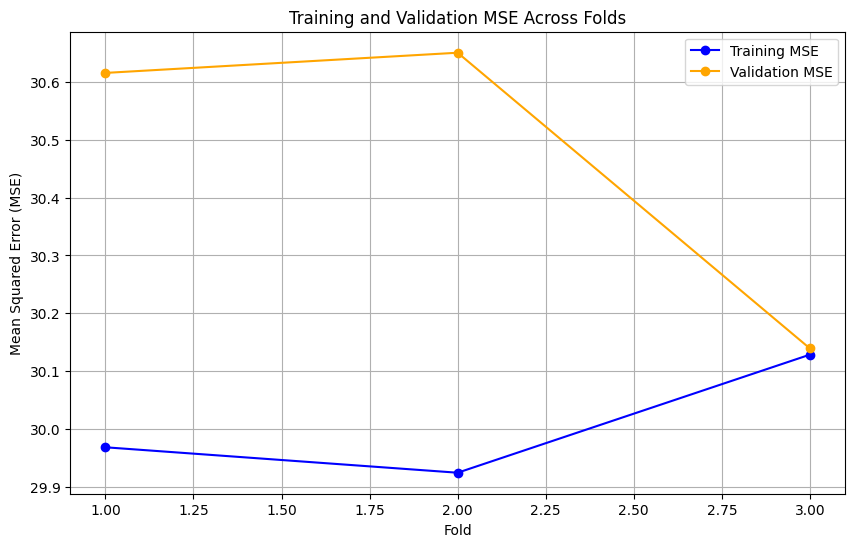

In [17]:
#Linear Regression using closed-form equation along with 3-fold validation
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.model_selection import KFold
from sklearn.preprocessing import StandardScaler

def normal_form(X, y, regularization_strength=1e-5):
    identity_matrix = np.eye(X.shape[1])
    return np.linalg.inv(X.T @ X + regularization_strength * identity_matrix) @ X.T @ y

def normal_form_cross_validation(X, y, folds=3, regularization_strength=1e-5):
    # Scale the data
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # KFold cross-validation setup
    kf = KFold(n_splits=folds, shuffle=True, random_state=42)

    train_mse_list = []
    val_mse_list = []
    fold_metrics = []

    for fold, (train_index, val_index) in enumerate(kf.split(X_scaled)):
        print(f"Fold {fold + 1}")

        # Split data into training and validation sets
        X_train, X_val = X_scaled[train_index], X_scaled[val_index]
        y_train, y_val = y.iloc[train_index], y.iloc[val_index]  # Assuming y is a DataFrame or Series

        theta = normal_form(X_train, y_train, regularization_strength)

        y_train_pred = X_train @ theta
        y_val_pred = X_val @ theta

        # Calculate performance metrics
        train_mse = mean_squared_error(y_train, y_train_pred)
        val_mse = mean_squared_error(y_val, y_val_pred)

        train_mae = mean_absolute_error(y_train, y_train_pred)
        val_mae = mean_absolute_error(y_val, y_val_pred)

        train_rmse = np.sqrt(train_mse)
        val_rmse = np.sqrt(val_mse)

        train_r2 = r2_score(y_train, y_train_pred)
        val_r2 = r2_score(y_val, y_val_pred)

        # Print the metrics for this fold
        print(f"Train MSE: {train_mse}, Val MSE: {val_mse}")
        print(f"Train MAE: {train_mae}, Val MAE: {val_mae}")
        print(f"Train RMSE: {train_rmse}, Val RMSE: {val_rmse}")
        print(f"Train R2: {train_r2}, Val R2: {val_r2}\n")

        # Store MSE values for plotting
        train_mse_list.append(train_mse)
        val_mse_list.append(val_mse)

        # Append metrics to the list
        fold_metrics.append({
            'train_mse': train_mse, 'val_mse': val_mse,
            'train_mae': train_mae, 'val_mae': val_mae,
            'train_rmse': train_rmse, 'val_rmse': val_rmse,
            'train_r2': train_r2, 'val_r2': val_r2
        })

    # Plot the training and validation MSE for each fold
    plot_fold_mse(train_mse_list, val_mse_list)

    return fold_metrics

# Function to plot the MSE for each fold
def plot_fold_mse(train_mse_list, val_mse_list):
    plt.figure(figsize=(10, 6))
    plt.plot(range(1, len(train_mse_list) + 1), train_mse_list, label='Training MSE', marker='o', color='blue')
    plt.plot(range(1, len(val_mse_list) + 1), val_mse_list, label='Validation MSE', marker='o', color='orange')

    plt.title('Training and Validation MSE Across Folds')
    plt.xlabel('Fold')
    plt.ylabel('Mean Squared Error (MSE)')
    plt.legend()
    plt.grid(True)
    plt.show()

# Call the function for cross-validation
metrics = normal_form_cross_validation(X_train, y_train)


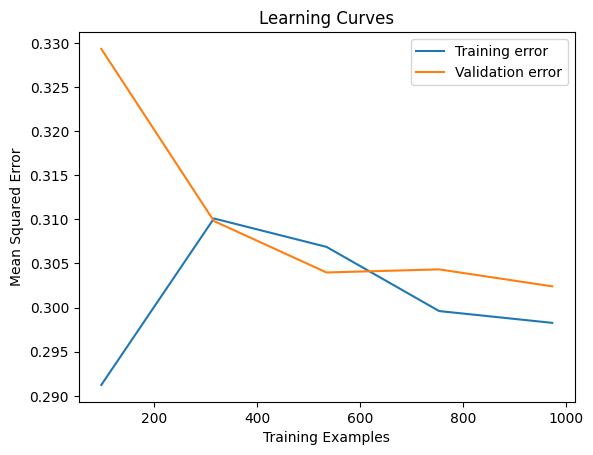

In [18]:
from sklearn.model_selection import learning_curve

train_sizes, train_scores, test_scores = learning_curve(reg, X_train, y_train, cv=3, scoring='neg_mean_squared_error')

train_scores_mean = -train_scores.mean(axis = 1)
test_scores_mean = -test_scores.mean(axis = 1)

plt.plot(train_sizes, train_scores_mean, label = 'Training error')
plt.plot(train_sizes, test_scores_mean, label = 'Validation error')
plt.legend()
plt.xlabel("Training Examples")
plt.ylabel("Mean Squared Error")
plt.title("Learning Curves")
plt.show()

In [20]:
#Training model using SGD
from sklearn.linear_model import SGDRegressor
from sklearn import metrics

sgd = SGDRegressor().fit(X_train, y_train)
sgd_y_pred = sgd.predict(X_test)

print('SGD R2 score:', sgd.score(X_test, y_test))
print('SGD MAE:', metrics.mean_absolute_error(y_test, sgd_y_pred))
print('SGD MSE:', metrics.mean_squared_error(y_test, sgd_y_pred))
print('SGD RMSE:', np.sqrt(metrics.mean_squared_error(y_test, sgd_y_pred)))
best_model['Name'].append('SGD')
best_model['MSE'].append(metrics.mean_squared_error(y_test, sgd_y_pred))
best_model['R2 score'].append(sgd.score(X_test, y_test))

SGD R2 score: -3.6127190211494026e+20
SGD MAE: 20792061707.471935
SGD MSE: 4.457060241918958e+20
SGD RMSE: 21111750855.670303


MAE: 22106655618.258965
MSE: 5.1920755214993385e+20
RMSE: 22786126308.566223


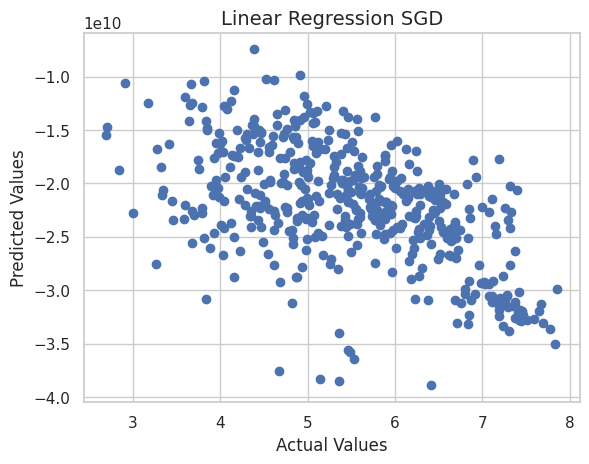

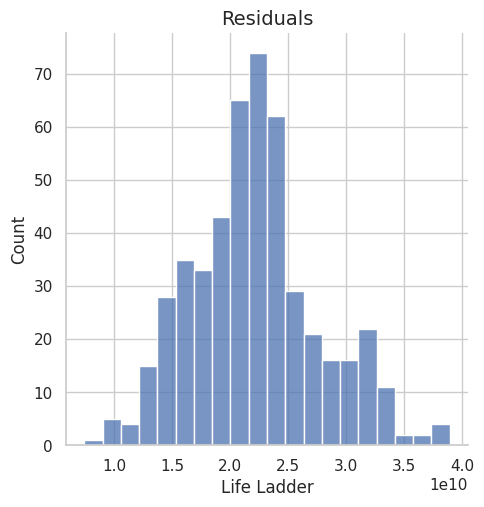

In [ ]:
print('MAE:', metrics.mean_absolute_error(y_test, sgd_y_pred))
print('MSE:', metrics.mean_squared_error(y_test, sgd_y_pred))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, sgd_y_pred)))

plot_model(y_test,sgd_y_pred,'SGD')
plt.show()

# Plotting Residuals
sns.displot((y_test - sgd_y_pred))
plt.title('Residuals',fontsize = 14)
plt.show()

In [ ]:
# 3-fold validation for SGD
from sklearn.model_selection import cross_val_score

scores = cross_val_score(sgd, X_train, y_train, cv=3)
print("SGD - Cross validation scores:", scores)
print("SGD - Mean cross-validation score:", np.mean(scores))

SGD - Cross validation scores: [-1.01969631e+21 -2.02519572e+21 -1.39906149e+21]
SGD - Mean cross-validation score: -1.4813178405084154e+21


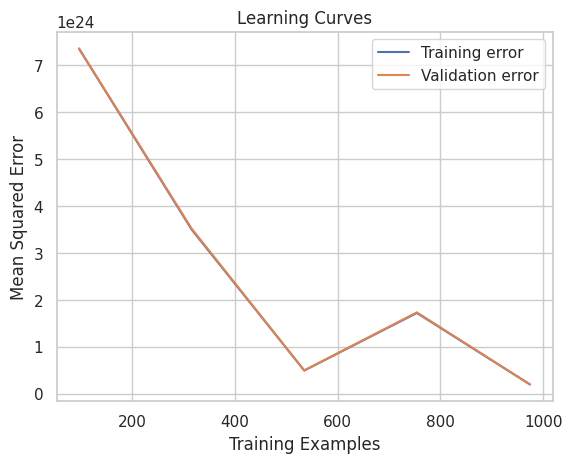

In [ ]:
# Learning Curve: SGD
train_sizes, train_scores, test_scores = learning_curve(sgd, X_train, y_train, cv=3, scoring='neg_mean_squared_error')

train_scores_mean = -train_scores.mean(axis = 1)
test_scores_mean = -test_scores.mean(axis = 1)

plt.plot(train_sizes, train_scores_mean, label = 'Training error')
plt.plot(train_sizes, test_scores_mean, label = 'Validation error')
plt.legend()
plt.xlabel("Training Examples")
plt.ylabel("Mean Squared Error")
plt.title("Learning Curves")
plt.show()

In [ ]:
# Exploring SGD with multiple hyperparameters - learning rate and batch size
from sklearn.linear_model import SGDRegressor
from sklearn import metrics
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# Hyperparameters
learning_rates = [0.001, 0.025, 0.5]
max_iters = [500, 5000, 10000]
batch_sizes = [16, 32, 64]  # You can modify these batch sizes
epochs = 50

results = []

# Loop through each combination of hyperparameters
for eta in learning_rates:
    for max_iter in max_iters:
        for batch_size in batch_sizes:
            sgd = SGDRegressor(learning_rate='constant', eta0=eta, max_iter=max_iter, tol=1e-3, random_state=42)

            train_losses = []
            val_losses = []

            # Generate indices for mini-batches
            num_samples = X_train.shape[0]
            indices = np.arange(num_samples)

            for epoch in range(epochs):
                np.random.shuffle(indices)  # Shuffle indices for stochastic gradient descent

                for start_idx in range(0, num_samples, batch_size):
                    end_idx = min(start_idx + batch_size, num_samples)
                    batch_indices = indices[start_idx:end_idx]

                    # Use iloc for DataFrame or Series to avoid KeyError
                    sgd.partial_fit(X_train.iloc[batch_indices], y_train.iloc[batch_indices])

                # Calculate losses after each epoch
                train_pred = sgd.predict(X_train)
                train_loss = metrics.mean_squared_error(y_train, train_pred)
                train_losses.append(train_loss)

                val_pred = sgd.predict(X_test)
                val_loss = metrics.mean_squared_error(y_test, val_pred)
                val_losses.append(val_loss)

            results.append({
                'Learning Rate': eta,
                'Max Iter': max_iter,
                'Batch Size': batch_size,
                'Train Losses': train_losses,
                'Validation Losses': val_losses
            })




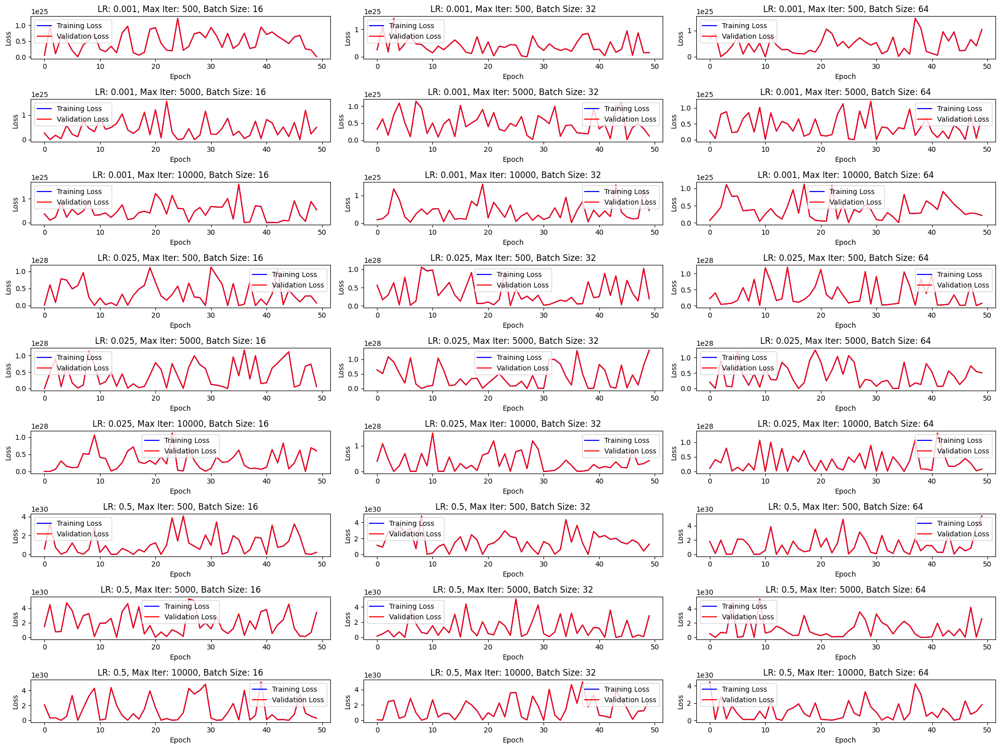

In [24]:
# Plotting results
plt.figure(figsize=(20, 15))

num_rows = 9
num_cols = 3

for i, (eta, max_iter, batch_size) in enumerate(((eta, mi, bs) for eta in learning_rates for mi in max_iters for bs in batch_sizes), start=1):
    plt.subplot(num_rows, num_cols, i)

    subset = [result for result in results if result['Learning Rate'] == eta and result['Max Iter'] == max_iter and result['Batch Size'] == batch_size][0]

    plt.plot(subset['Train Losses'], label='Training Loss', color='blue')
    plt.plot(subset['Validation Losses'], label='Validation Loss', color='red')

    plt.title(f'LR: {eta}, Max Iter: {max_iter}, Batch Size: {batch_size}')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()

plt.tight_layout()
plt.show()


In [ ]:
#Results for hyperparamter tuning
print(results)

[{'Learning Rate': 0.001, 'Max Iter': 500, 'R2 Score': -4.8179500424423324e+24, 'MAE': 2421763817147.179, 'MSE': 5.943970028117344e+24, 'RMSE': 2438025846482.63}, {'Learning Rate': 0.01, 'Max Iter': 500, 'R2 Score': -2.5611141413101586e+26, 'MAE': 17658371110142.53, 'MSE': 3.159681100972578e+26, 'RMSE': 17775491838406.547}, {'Learning Rate': 0.1, 'Max Iter': 500, 'R2 Score': -2.336841542324423e+28, 'MAE': 168685826046779.47, 'MSE': 2.882992967065854e+28, 'RMSE': 169793785724503.3}]


#***Ridge***

In [ ]:
# Ridge regularization

from sklearn.linear_model import Ridge

ridge = Ridge(alpha=0.5,fit_intercept=True).fit(X_train, y_train)
ridge_y_pred = ridge.predict(X_test)

print('Ridge Regression R2 score:', ridge.score(X_test, y_test))
best_model['Name'].append('Ridge Regularization')
best_model['MSE'].append(metrics.mean_squared_error(y_test, ridge_y_pred))
best_model['R2 score'].append(ridge.score(X_test, y_test))

Ridge Regression R2 score: 0.760338994374667


MAE: 0.42686999032894574
MSE: 0.29567301898035236
RMSE: 0.5437582357816315


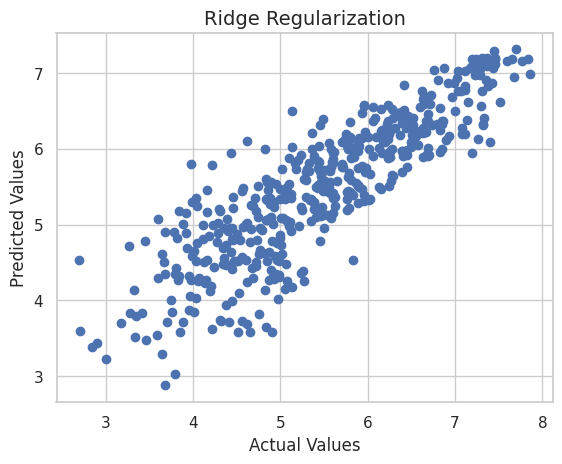

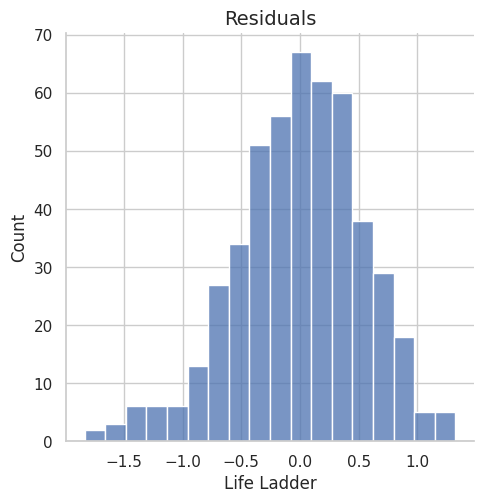

In [ ]:
print('MAE:', metrics.mean_absolute_error(y_test, ridge_y_pred))
print('MSE:', metrics.mean_squared_error(y_test, ridge_y_pred))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, ridge_y_pred)))

plot_model(y_test,ridge_y_pred,'Ridge Regularization')

# Plotting Residuals
sns.displot((y_test - ridge_y_pred))
plt.title('Residuals',fontsize = 14)
plt.show()

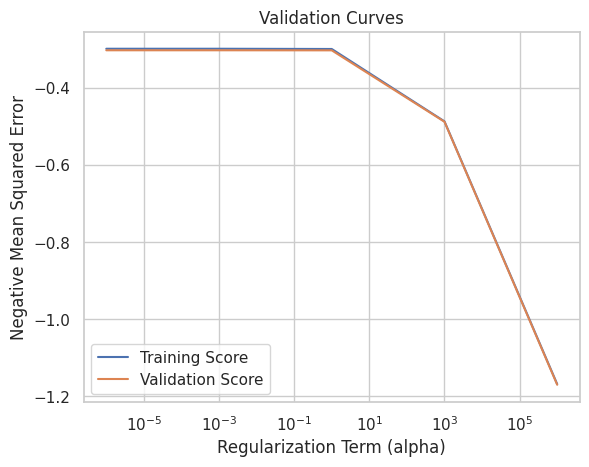

In [ ]:
#Validation curve for Ridge
from sklearn.model_selection import validation_curve

param_range = np.logspace(-6, 6, 5)

train_scores, valid_scores = validation_curve(ridge, X_train, y_train, param_name="alpha", param_range=param_range, cv=4, scoring="neg_mean_squared_error")

plt.plot(param_range, np.mean(train_scores, axis=1), label="Training Score")
plt.plot(param_range, np.mean(valid_scores, axis=1), label="Validation Score")
plt.xscale("log")
plt.legend(loc="best")
plt.xlabel("Regularization Term (alpha)")
plt.ylabel("Negative Mean Squared Error")
plt.title("Validation Curves")
plt.show()

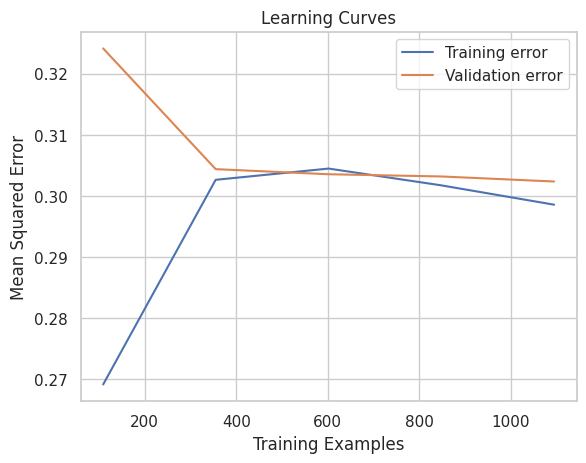

In [ ]:
#Learning curve for Ridge
from sklearn.model_selection import learning_curve

train_sizes, train_scores, test_scores = learning_curve(ridge, X_train, y_train, cv=4, scoring='neg_mean_squared_error')

train_scores_mean = -train_scores.mean(axis = 1)
test_scores_mean = -test_scores.mean(axis = 1)

plt.plot(train_sizes, train_scores_mean, label = 'Training error')
plt.plot(train_sizes, test_scores_mean, label = 'Validation error')
plt.legend()
plt.xlabel("Training Examples")
plt.ylabel("Mean Squared Error")
plt.title("Learning Curves")
plt.show()

Ridge Regularization R2 score for alpha 0.0: 0.7606244438881958
MAE: 0.42621557250492287
MSE: 0.29532085606085157
RMSE: 0.5434343162341255



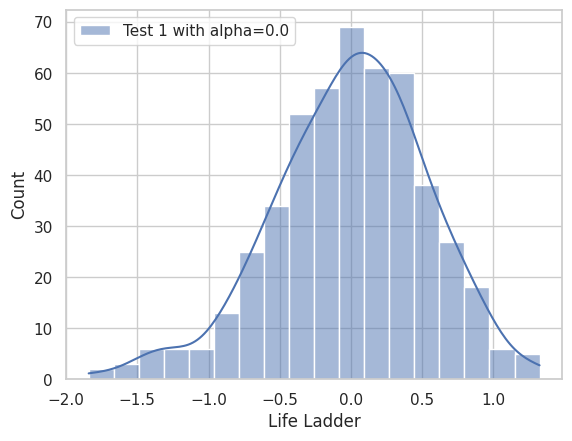

<Figure size 640x480 with 0 Axes>

Ridge Regularization R2 score for alpha 0.2: 0.7605259437587286
MAE: 0.4264530585797368
MSE: 0.29544237700070375
RMSE: 0.5435461130398264



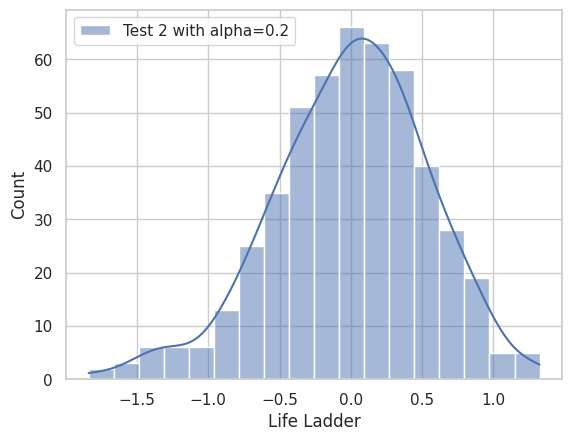

<Figure size 640x480 with 0 Axes>

Ridge Regularization R2 score for alpha 0.4: 0.760405952672027
MAE: 0.4267291790439319
MSE: 0.2955904116247062
RMSE: 0.5436822708390501



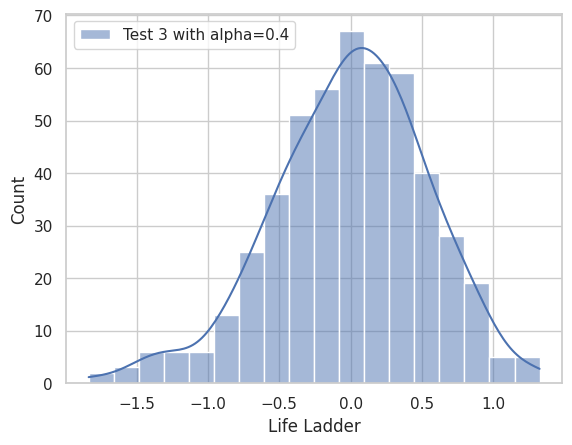

<Figure size 640x480 with 0 Axes>

Ridge Regularization R2 score for alpha 0.7: 0.7601930133028616
MAE: 0.42715794048843875
MSE: 0.2958531177999417
RMSE: 0.5439238161727631



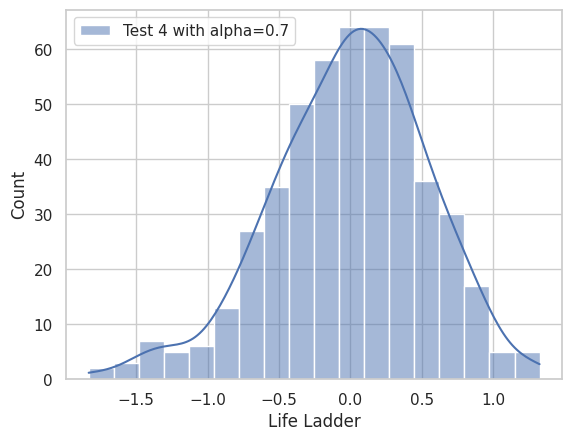

<Figure size 640x480 with 0 Axes>

Ridge Regularization R2 score for alpha 1.0: 0.7599485417624635
MAE: 0.42762854167087094
MSE: 0.2961547256406318
RMSE: 0.5442009974638339



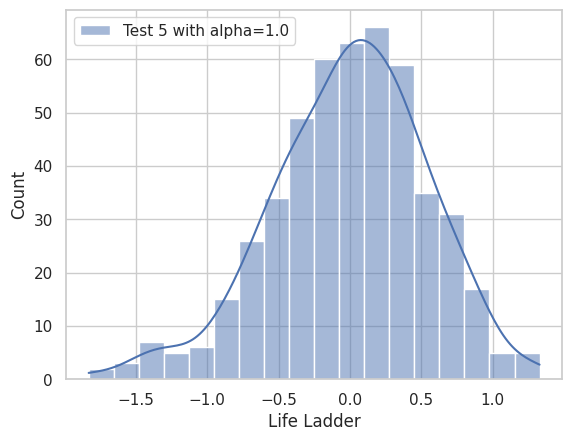

<Figure size 640x480 with 0 Axes>

In [ ]:
# Testing Ridge on multiple penalties along with histograms

alpha = [0.0,0.2,0.4,0.7,1.0]
for n,i in enumerate(alpha):
    ridge_dic = {}
    ridge_test = Ridge(alpha=i,fit_intercept=True).fit(X_train, y_train)
    ridge_test_y_pred = ridge_test.predict(X_test)
    name = 'Test {} with alpha={}'.format(n+1,i)
    ridge_dic[name] = y_test-ridge_test_y_pred
    print('Ridge Regularization R2 score for alpha {}: {}'.format(i, ridge_test.score(X_test, y_test)))
    print('MAE:', metrics.mean_absolute_error(y_test, ridge_test_y_pred))
    print('MSE:', metrics.mean_squared_error(y_test, ridge_test_y_pred))
    print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, ridge_test_y_pred)))
    print()
    ridge_df = pd.DataFrame(ridge_dic)
    sns.set(style="whitegrid")
    sns.histplot(ridge_df,kde=True)
    plt.xlabel('Life Ladder')
    plt.figure()
    plt.show()

#***Lasso***

In [ ]:
# Regularisation: Lasso

from sklearn.linear_model import Lasso

lasso = Lasso(alpha=0.5).fit(X_train, y_train)
lasso_y_pred = lasso.predict(X_test)

print('Lasso Regression R2 score:', lasso.score(X_test, y_test))
best_model['Name'].append('Lasso Regularization')
best_model['MSE'].append(metrics.mean_squared_error(y_test, lasso_y_pred))
best_model['R2 score'].append(lasso.score(X_test, y_test))

Lasso Regression R2 score: 0.52120395761349


MAE: 0.6325550630012634
MSE: 0.5906971430704038
RMSE: 0.768568242298889


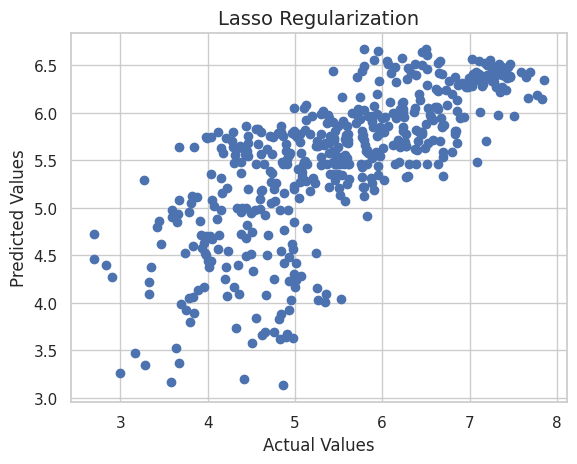

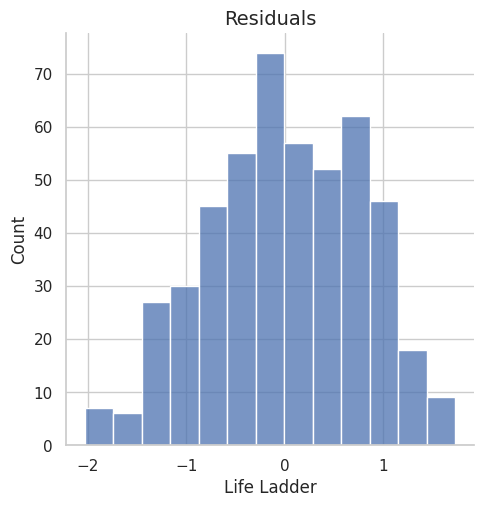

In [ ]:
print('MAE:', metrics.mean_absolute_error(y_test, lasso_y_pred))
print('MSE:', metrics.mean_squared_error(y_test, lasso_y_pred))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, lasso_y_pred)))

plot_model(y_test,lasso_y_pred,'Lasso Regularization')
plt.show()

# Plotting Residuals
sns.displot((y_test - lasso_y_pred))
plt.title('Residuals',fontsize = 14)
plt.show()

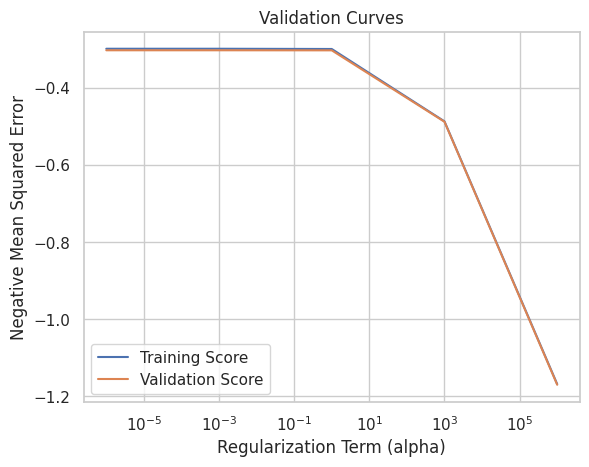

In [ ]:
# Validation curve for Lasso
param_range = np.logspace(-6, 6, 5)

train_scores, valid_scores = validation_curve(ridge, X_train, y_train, param_name="alpha", param_range=param_range, cv=4, scoring="neg_mean_squared_error")

plt.plot(param_range, np.mean(train_scores, axis=1), label="Training Score")
plt.plot(param_range, np.mean(valid_scores, axis=1), label="Validation Score")
plt.xscale("log")
plt.legend(loc="best")
plt.xlabel("Regularization Term (alpha)")
plt.ylabel("Negative Mean Squared Error")
plt.title("Validation Curves")
plt.show()

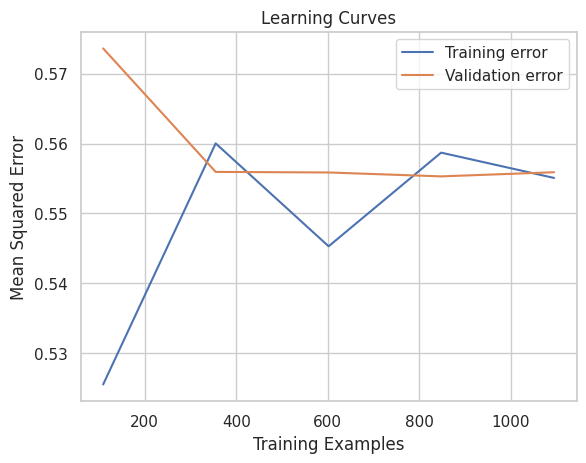

In [ ]:
#Learning curve for Lasso
train_sizes, train_scores, test_scores = learning_curve(lasso, X_train, y_train, cv=4, scoring='neg_mean_squared_error')

train_scores_mean = -train_scores.mean(axis = 1)
test_scores_mean = -test_scores.mean(axis = 1)

plt.plot(train_sizes, train_scores_mean, label = 'Training error')
plt.plot(train_sizes, test_scores_mean, label = 'Validation error')
plt.legend()
plt.xlabel("Training Examples")
plt.ylabel("Mean Squared Error")
plt.title("Learning Curves")
plt.show()

Lasso Regression R2 score for alpha 0.0: 0.760624443888196
MAE: 0.4262155725049227
MSE: 0.2953208560608513
RMSE: 0.5434343162341253



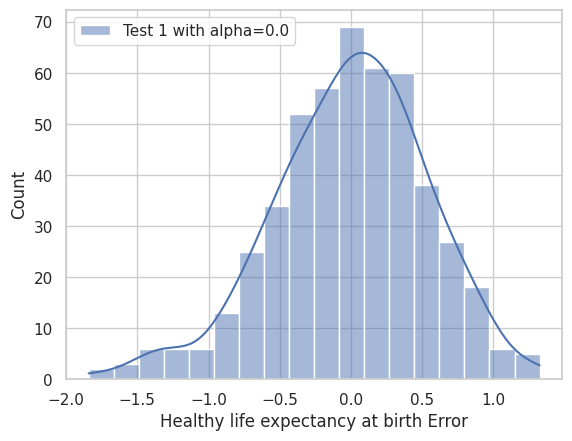

<Figure size 640x480 with 0 Axes>

Lasso Regression R2 score for alpha 0.2: 0.5434810236151957
MAE: 0.6162621997277704
MSE: 0.5632136259184894
RMSE: 0.7504755998155366



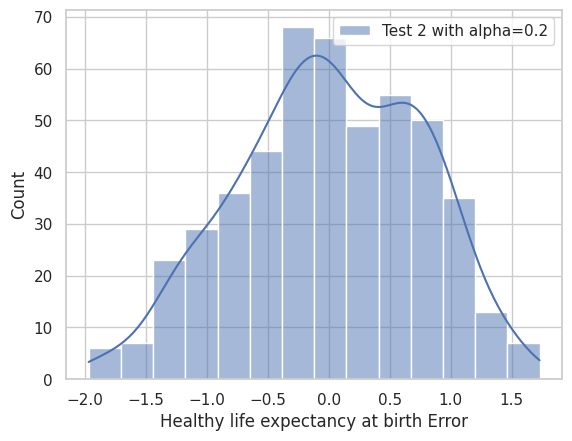

<Figure size 640x480 with 0 Axes>

Lasso Regression R2 score for alpha 0.4: 0.5220506583401392
MAE: 0.6314331107321669
MSE: 0.5896525569502381
RMSE: 0.7678883753191202



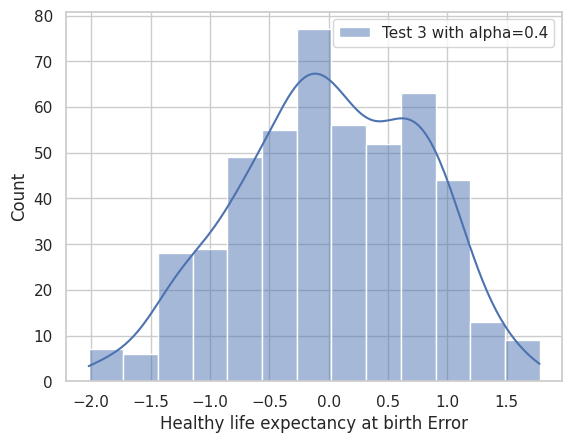

<Figure size 640x480 with 0 Axes>

Lasso Regression R2 score for alpha 0.7: 0.5186478582738534
MAE: 0.6350516103076163
MSE: 0.5938506373428328
RMSE: 0.7706170497353616



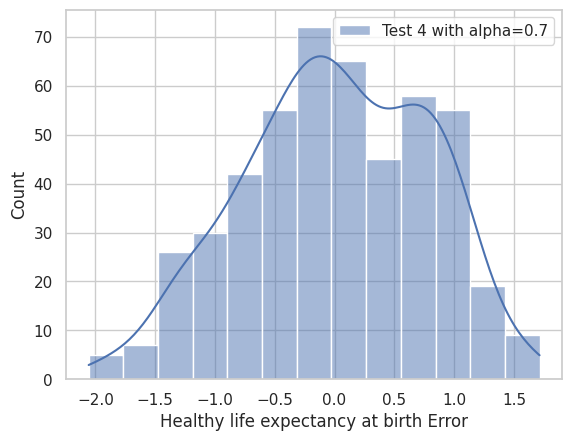

<Figure size 640x480 with 0 Axes>

Lasso Regression R2 score for alpha 1.0: 0.5126569645485519
MAE: 0.6395350523184612
MSE: 0.6012416838317202
RMSE: 0.7753977584644671



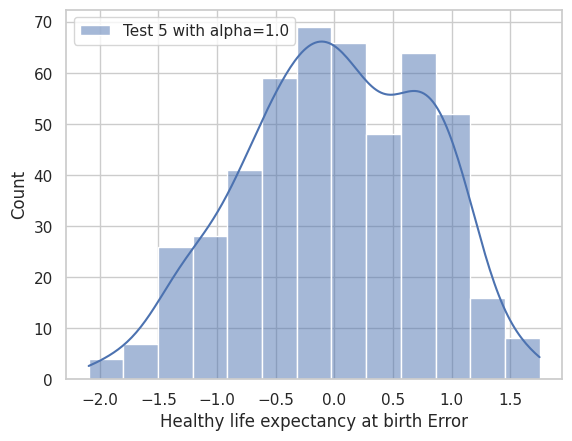

<Figure size 640x480 with 0 Axes>

In [ ]:
# Exploring lasso regression over multiple penalties along with visualizations using histograms
alpha = [0.0,0.2,0.4,0.7,1.0]
for n,i in enumerate(alpha):
    lasso_dic = {}
    lasso_test = Lasso(alpha=i).fit(X_train, y_train)
    lasso_test_y_pred = lasso_test.predict(X_test)
    name = 'Test {} with alpha={}'.format(n+1,i)
    lasso_dic[name] = y_test-lasso_test_y_pred
    print('Lasso Regression R2 score for alpha {}: {}'.format(i, lasso_test.score(X_test, y_test)))
    print('MAE:', metrics.mean_absolute_error(y_test, lasso_test_y_pred))
    print('MSE:', metrics.mean_squared_error(y_test, lasso_test_y_pred))
    print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, lasso_test_y_pred)))
    print()
    lasso_df = pd.DataFrame(lasso_dic)
    sns.set(style="whitegrid")
    sns.histplot(lasso_df,kde=True)
    plt.xlabel('Healthy life expectancy at birth Error')
    plt.figure()
    plt.show()

#***ElasticNet***

In [ ]:
#Regularisation: ElasticNet
from sklearn.linear_model import ElasticNet

elastic_net = ElasticNet(alpha=0.5, l1_ratio=0.5).fit(X_train, y_train)
elastic_net_y_pred = elastic_net.predict(X_test)

print('Elastic Net Regression R2 score: ', elastic_net.score(X_test, y_test))
best_model['Name'].append('Elastic Net Regularization')
best_model['MSE'].append(metrics.mean_squared_error(y_test, elastic_net_y_pred))
best_model['R2 score'].append(elastic_net.score(X_test, y_test))

Elastic Net Regression R2 score:  0.5226981570909921


MAE: 0.6303489600837245
MSE: 0.5888537289976006
RMSE: 0.7673680531515503


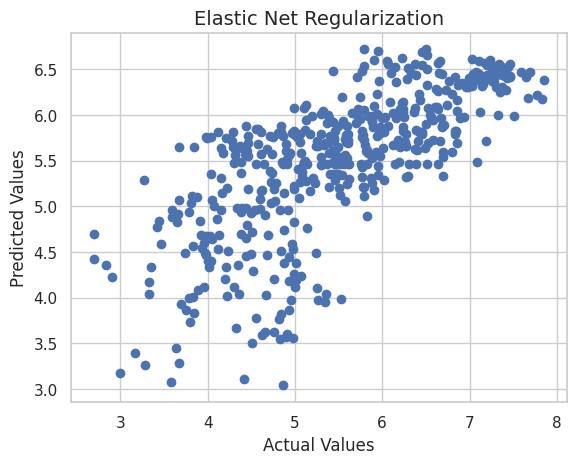

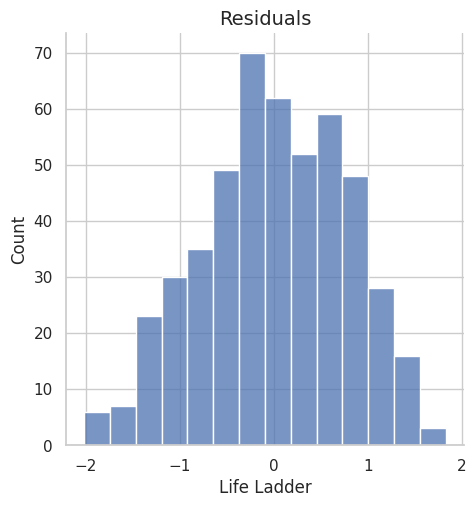

In [ ]:
print('MAE:', metrics.mean_absolute_error(y_test, elastic_net_y_pred))
print('MSE:', metrics.mean_squared_error(y_test, elastic_net_y_pred))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, elastic_net_y_pred)))

plot_model(y_test,elastic_net_y_pred,'Elastic Net Regularization')
plt.show()

# Plotting Residuals
sns.displot((y_test - elastic_net_y_pred))
plt.title('Residuals',fontsize = 14)
plt.show()

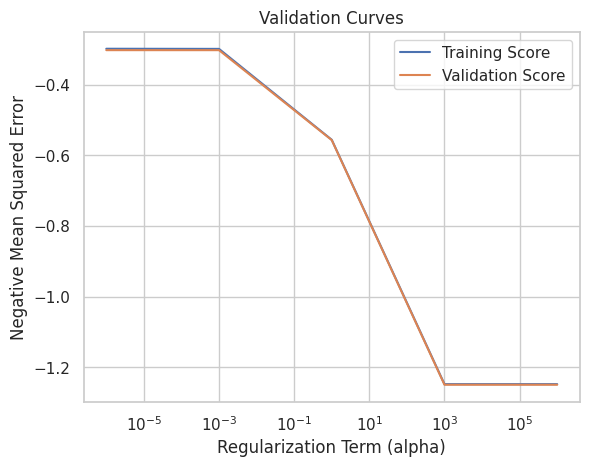

In [ ]:
#Validation curve for ElasticNet
param_range = np.logspace(-6, 6, 5)

train_scores, valid_scores = validation_curve(elastic_net, X_train, y_train, param_name="alpha", param_range=param_range, cv=4, scoring="neg_mean_squared_error")

plt.plot(param_range, np.mean(train_scores, axis=1), label="Training Score")
plt.plot(param_range, np.mean(valid_scores, axis=1), label="Validation Score")
plt.xscale("log")
plt.legend(loc="best")
plt.xlabel("Regularization Term (alpha)")
plt.ylabel("Negative Mean Squared Error")
plt.title("Validation Curves")
plt.show()

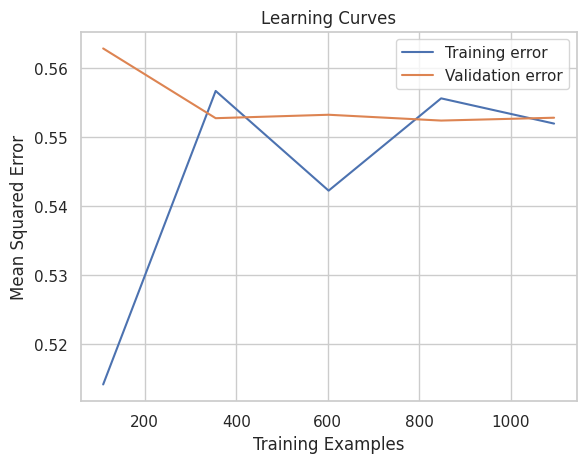

In [ ]:
##Learning curve for ElasticNet
train_sizes, train_scores, test_scores = learning_curve(elastic_net, X_train, y_train, cv=4, scoring='neg_mean_squared_error')

train_scores_mean = -train_scores.mean(axis = 1)
test_scores_mean = -test_scores.mean(axis = 1)

plt.plot(train_sizes, train_scores_mean, label = 'Training error')
plt.plot(train_sizes, test_scores_mean, label = 'Validation error')
plt.legend()
plt.xlabel("Training Examples")
plt.ylabel("Mean Squared Error")
plt.title("Learning Curves")
plt.show()

Elastic-Net Regularization R2 score for alpha 0.0 and L1-ratio 1.0: 0.760624443888196
MAE: 0.4262155725049227
MSE: 0.2953208560608513
RMSE: 0.5434343162341253



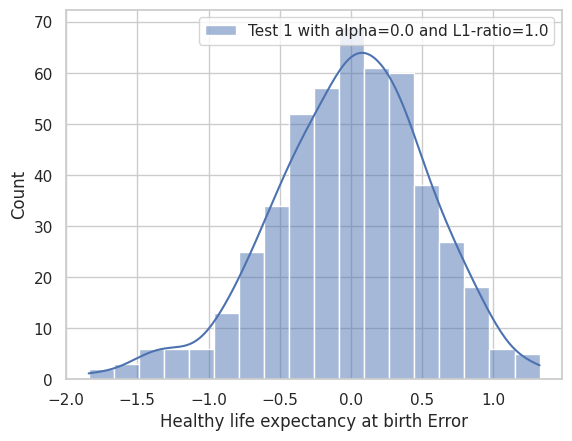

<Figure size 640x480 with 0 Axes>

Elastic-Net Regularization R2 score for alpha 0.2 and L1-ratio 0.7: 0.5818562306085955
MAE: 0.5895869423677969
MSE: 0.5158696148386366
RMSE: 0.7182406385318479



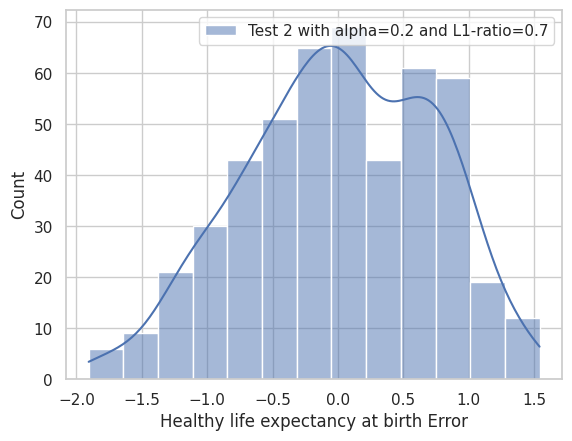

<Figure size 640x480 with 0 Axes>

Elastic-Net Regularization R2 score for alpha 0.4 and L1-ratio 0.4: 0.5584506318743512
MAE: 0.6062325468877153
MSE: 0.5447454180621929
RMSE: 0.7380687082258622



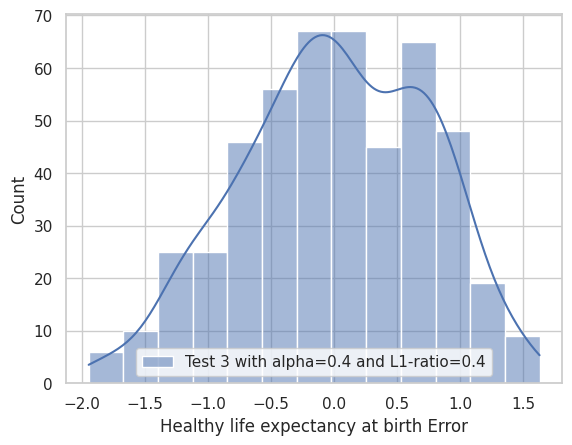

<Figure size 640x480 with 0 Axes>

Elastic-Net Regularization R2 score for alpha 0.7 and L1-ratio 0.2: 0.5554588008514731
MAE: 0.6083278955549043
MSE: 0.5484364803962813
RMSE: 0.7405649737843948



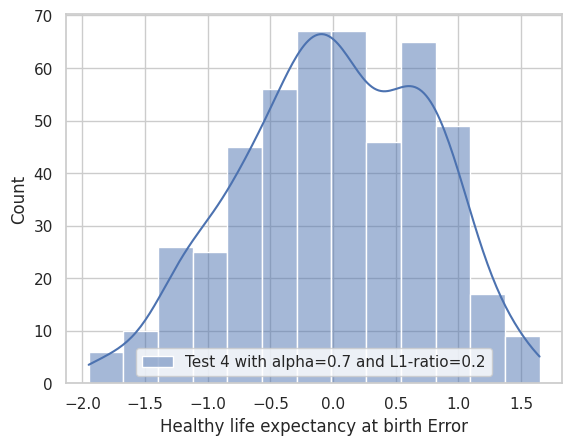

<Figure size 640x480 with 0 Axes>

Elastic-Net Regularization R2 score for alpha 1.0 and L1-ratio 0.0: 0.5860744001545224
MAE: 0.5865008192440883
MSE: 0.5106656021084014
RMSE: 0.7146087055923692



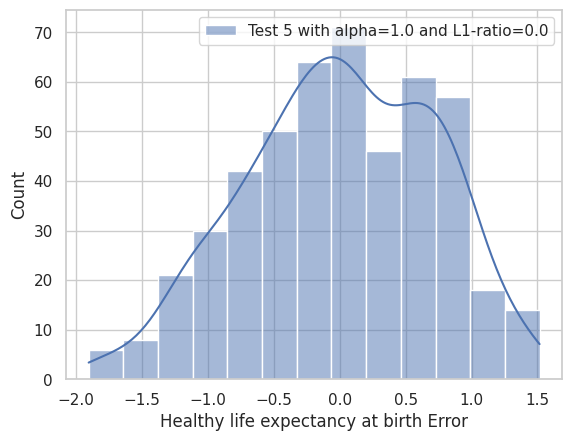

<Figure size 640x480 with 0 Axes>

In [ ]:
# Exploring Elasticnet for multiple penalties along with histograms

alpha = [0.0,0.2,0.4,0.7,1.0]
l1_ratio = [1.0,0.7,0.4,0.2,0.0]
elastic_net_dic = {}
for n,i in enumerate(zip(alpha,l1_ratio)):
    elastic_net_dic = {}
    elastic_net_test = elastic_net = ElasticNet(alpha=i[0], l1_ratio=i[1]).fit(X_train, y_train)
    elastic_net_test_y_pred = elastic_net_test.predict(X_test)
    name = 'Test {} with alpha={} and L1-ratio={}'.format(n+1,i[0],i[1])
    elastic_net_dic[name] = y_test-elastic_net_test_y_pred
    print('Elastic-Net Regularization R2 score for alpha {} and L1-ratio {}: {}'.format(i[0], i[1], elastic_net_test.score(X_test, y_test)))
    print('MAE:', metrics.mean_absolute_error(y_test, elastic_net_test_y_pred))
    print('MSE:', metrics.mean_squared_error(y_test, elastic_net_test_y_pred))
    print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, elastic_net_test_y_pred)))
    print()
    elastic_net_df = pd.DataFrame(elastic_net_dic)
    sns.set(style="whitegrid")
    sns.histplot(elastic_net_df,kde=True)
    plt.xlabel('Healthy life expectancy at birth Error')
    plt.figure()
    plt.show()

## E. Summary:

### Question-E Part 1: Linear Regression - Normal Equation, SGD, K-Fold
- **Closed-Form Solution**:
  - **R² Score**: 0.7606
  - **Mean Absolute Error (MAE)**: 0.4262
  - **Mean Squared Error (MSE)**: 0.2953
  - **Root Mean Squared Error (RMSE)**: 0.5434
  - **Cross-Validation Scores**: Mean of 0.7572 indicates stable performance across folds.
  - The closed-form solution performs well, providing a decent fit without overfitting.

- **Stochastic Gradient Descent (SGD)**:
  - **R² Score**: -1.2188e+21 (indicating severe underfitting)
  - **MAE**: 3.8120e+10
  - **MSE**: 1.5037e+21
  - **Cross-Validation Scores**: Extremely negative values show the model fails to capture data patterns.
  - This indicates significant issues with either the learning rate or batch size, resulting in a non-converging model.

### Question-E Part 2: Regularization
- **Ridge Regression**:
  - **Best R² Score**: 0.7603 (with minor reductions as alpha increases).
  - Scores remain consistent across various alpha values, suggesting that Ridge regularization stabilizes the model without losing much predictive power.

- **Lasso Regression**:
  - **Best R² Score**: 0.5212 (substantially lower than Ridge and Closed Form).
  - R² scores drop significantly as alpha increases, indicating that Lasso regularization is overly penalizing and leading to underfitting, especially at higher alpha values.
  - MAE and RMSE increase with alpha, highlighting the negative impact of the L1 penalty.

- **Elastic Net Regression**:
  - **Best R² Score**: 0.5861 (for alpha = 1.0 and L1-ratio = 0.0).
  - Elastic Net yields better performance compared to Lasso but remains below Ridge regression scores.
  - The combination of L1 and L2 penalties can help mitigate issues with coefficient shrinkage seen in Lasso.

### Question-E Part 3: Hyperparameter Tuning and Description
- **Hyperparameter Tuning**:
  - **Learning Rate and Batch Size in SGD**: The model showed extremely high loss metrics, suggesting that the learning rate might have been too high, or the model was improperly initialized. Adjusting these parameters could potentially improve performance.

- **Regularization Strength (alpha)**:
  - Ridge regression shows consistent performance, but increasing alpha still slightly affects R² negatively, indicating that Ridge can handle regularization without significant loss of information.
  - Lasso demonstrates a clear negative impact on performance with increased alpha, leading to excessive model simplification.

- **Description of Models**:
  - **Closed-Form Solution**: Best overall performance, balancing bias and variance.
  - **SGD**: Struggles significantly due to convergence issues; tuning is necessary.
  - **Ridge Regression**: Offers stability across different regularization strengths.
  - **Lasso Regression**: Tends to underfit the data due to excessive penalization.
  - **Elastic Net**: Provides a middle ground but does not surpass Ridge's performance.

### Conclusion
- The closed-form linear regression model provides the best performance overall, while SGD struggles due to convergence issues.
- Ridge regression offers stability across different regularization strengths, whereas Lasso tends to underfit the data.
- Elastic Net provides a middle ground but does not surpass Ridge's performance in this case.
- Careful tuning of learning rate and other hyperparameters is crucial for optimizing models, particularly for SGD, to avoid severe underfitting.


#F. Repeat everything from part E with polynomial regression and using SGD. Using validation loss, explore if your model overfits/underfits the data.

#***Polynomial Regression***

In [28]:
from sklearn.model_selection import train_test_split
X = df.drop(['Life Ladder', 'year', 'Country name'], axis=1)
y = df['Life Ladder']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

In [29]:
# Generate polynomial features with degree 2
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import SGDRegressor, LinearRegression
from sklearn.model_selection import cross_val_score

poly = PolynomialFeatures(degree=2)
X_train_poly = poly.fit_transform(X_train)
X_test_poly = poly.fit_transform(X_test)

In [ ]:
# Fit the model with polynomial features
model = LinearRegression()
model.fit(X_train_poly, y_train)

# Evaluate the model using mean squared error
scores = cross_val_score(model, X_train_poly, y_train, cv=4)
train_mse = np.mean((y_train - model.predict(X_train_poly))**2)
test_mse = np.mean((y_test - model.predict(X_test_poly))**2)
best_model['Name'].append('Polynomial Linear Regression')
best_model['MSE'].append(test_mse)
best_model['R2 score'].append(model.score(X_test_poly, y_test))
print("Polynomial Train data MSE:", train_mse)
print("Polynomial Test data MSE:", test_mse)
print("Mean Cross-Validation Score:", scores.mean())

Polynomial Train data MSE: 0.24699176269712997
Polynomial Test data MSE: 0.253860987718099
Mean Cross-Validation Score: 0.7836637041048705


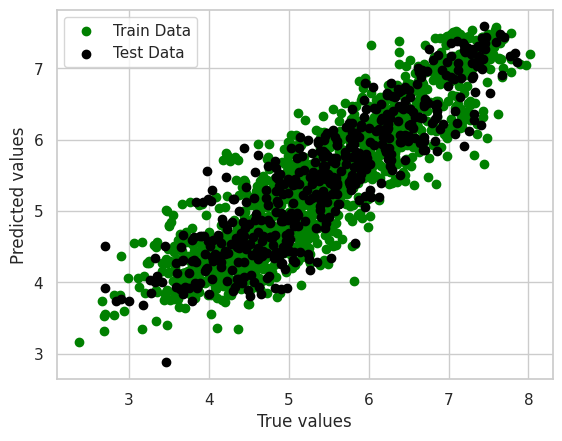

In [ ]:
# Plot the model predictions against actual values
plt.scatter(y_train, model.predict(X_train_poly), color='green', label='Train Data')
plt.scatter(y_test, model.predict(X_test_poly), color='black',label='Test Data')
plt.xlabel("True values")
plt.ylabel("Predicted values")
plt.legend()
plt.show()

In [ ]:
# Train the polynomial regression model using the closed form solution (normal equation)

theta_train = np.linalg.inv(X_train_poly.T.dot(X_train_poly)).dot(X_train_poly.T).dot(y_train)

theta_test = np.linalg.inv(X_test_poly.T.dot(X_test_poly)).dot(X_test_poly.T).dot(y_test)

# Make predictions on the training data
y_pred_train = X_train_poly.dot(theta_train)
y_pred_test = X_test_poly.dot(theta_test)

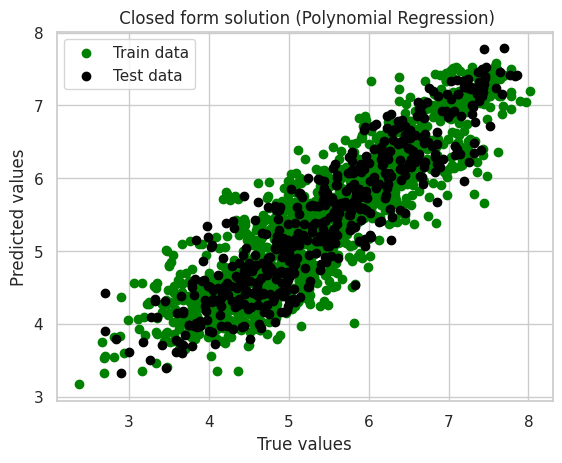

In [ ]:
#Plot the True and predicted values of closed form solution
plt.scatter(y_train, y_pred_train, color='green', label='Train data')
plt.scatter(y_test, y_pred_test, color='black', label='Test data')
plt.xlabel("True values")
plt.ylabel("Predicted values")
plt.title(" Closed form solution (Polynomial Regression)")
plt.legend()
plt.show()

Polynomial Regression Closed Form - MAE: 0.3631593839697026
Polynomial Regression Closed Form - MSE: 0.21299237594517215
Polynomial Regression Closed Form - RMSE: 0.4615109705577671


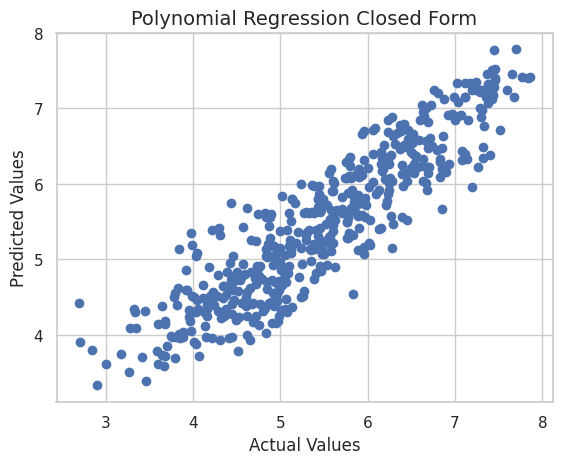

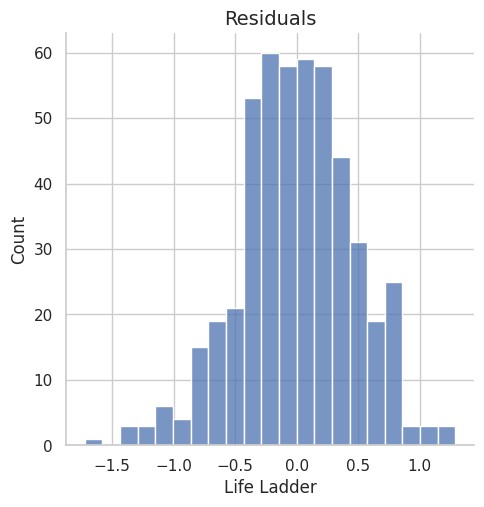

In [ ]:
print('Polynomial Regression Closed Form - MAE:', metrics.mean_absolute_error(y_test, y_pred_test))
print('Polynomial Regression Closed Form - MSE:', metrics.mean_squared_error(y_test, y_pred_test))
print('Polynomial Regression Closed Form - RMSE:', np.sqrt(metrics.mean_squared_error(y_test, y_pred_test)))

best_model['Name'].append('Polynomial Regression Closed Form')
best_model['MSE'].append(metrics.mean_squared_error(y_test, y_pred_test))
best_model['R2 score'].append(model.score(X_test_poly, y_test))

plot_model(y_test,y_pred_test,'Polynomial Regression Closed Form')
plt.show()

# Plotting Residuals
sns.displot((y_test - y_pred_test))
plt.title('Residuals',fontsize = 14)
plt.show()

In [ ]:
# Perform 3-fold cross-validation on the linear regression model
cv_scores = cross_val_score(model, X_train_poly, y_train, cv=3)
print("Cross-validation scores:", cv_scores)
print("Mean cross-validation score:", np.mean(cv_scores))

Cross-validation scores: [0.79637169 0.76927838 0.78318657]
Mean cross-validation score: 0.7829455464022231


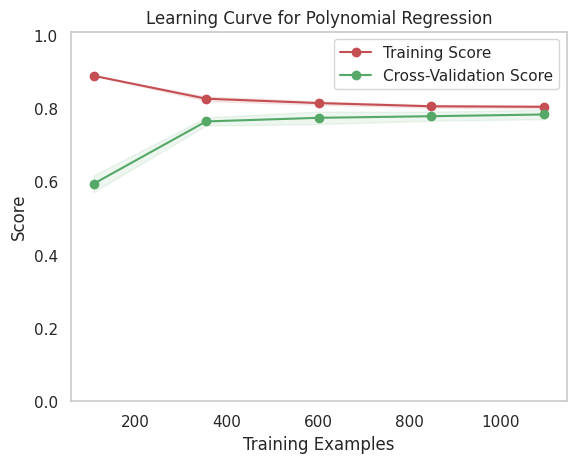

In [ ]:
# Learning Curve for Polynomial Regression for Closed form
from sklearn.pipeline import make_pipeline
polynomial_regression = make_pipeline(PolynomialFeatures(degree=2), LinearRegression(fit_intercept=False))

train_sizes, train_scores, test_scores = learning_curve(polynomial_regression, X_train, y_train, cv=4)

train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)
test_scores_std = np.std(test_scores, axis=1)

plt.figure()
plt.title("Learning Curve for Polynomial Regression")
plt.xlabel("Training Examples")
plt.ylabel("Score")
plt.ylim((0.0, 1.01))
plt.grid()
plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                 train_scores_mean + train_scores_std, alpha=0.1, color="r")
plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                 test_scores_mean + test_scores_std, alpha=0.1, color="g")
plt.plot(train_sizes, train_scores_mean, 'o-', color="r", label="Training Score")
plt.plot(train_sizes, test_scores_mean, 'o-', color="g", label="Cross-Validation Score")
plt.legend(loc="best")
plt.show()

In [ ]:
# Compute the training and validation loss
from sklearn.metrics import mean_squared_error

y_train_pred = model.predict(X_train_poly)
y_val_pred = model.predict(X_test_poly)
train_loss = mean_squared_error(y_train, y_train_pred)
val_loss = mean_squared_error(y_test, y_val_pred)
print("Validation loss of the lm_poly is: ",val_loss)
print("Training loss of the lm_poly is: ",train_loss)

Validation loss of the lm_poly is:  0.253860987718099
Training loss of the lm_poly is:  0.24699176269712997


In [30]:
# Fit a SGD model with polynomial features
sgd_model = SGDRegressor()
sgd_model.fit(X_train_poly, y_train)

SGDRegressor()

In [31]:
# Evaluate the SGD model using mean squared error
sgd_train_mse = np.mean((y_train - sgd_model.predict(X_train_poly))**2)
sgd_test_mse = np.mean((y_test - sgd_model.predict(X_test_poly))**2)
print("SGD Train MSE:", sgd_train_mse)
print("SGD Test MSE:", sgd_test_mse)

best_model['Name'].append('Polynomial SGD')
best_model['MSE'].append(sgd_test_mse)
best_model['R2 score'].append(sgd_model.score(X_test_poly, y_test))

SGD Train MSE: 5.441122254212996e+30
SGD Test MSE: 5.510629583327646e+30


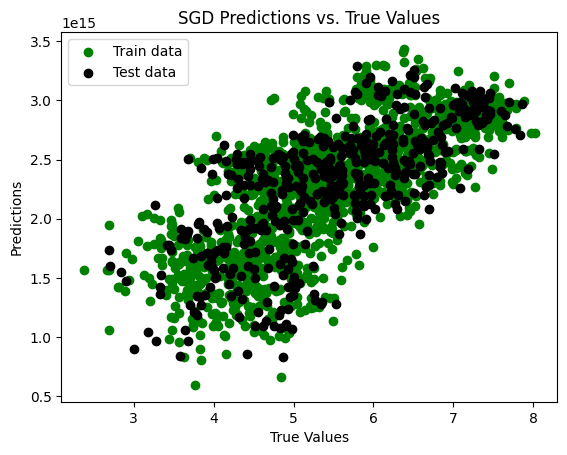

In [32]:
# Plot the SGD predictions vs. the true values
plt.scatter(y_train, sgd_model.predict(X_train_poly), color='green', label='Train data')
plt.scatter(y_test, sgd_model.predict(X_test_poly), color='black', label='Test data')
plt.xlabel("True Values")
plt.ylabel("Predictions")
plt.title("SGD Predictions vs. True Values")
plt.legend()
plt.show()

In [ ]:
# 3-fold validation for SGD
scores = cross_val_score(sgd_model, X_train_poly, y_train, cv=3)
print("SGD - Cross validation scores:", scores)
print("SGD - Mean cross-validation score:", np.mean(scores))

SGD - Cross validation scores: [-1.04370689e+31 -9.55165082e+30 -2.15007869e+29 -4.45135312e+31]
SGD - Mean cross-validation score: -1.617931470357446e+31


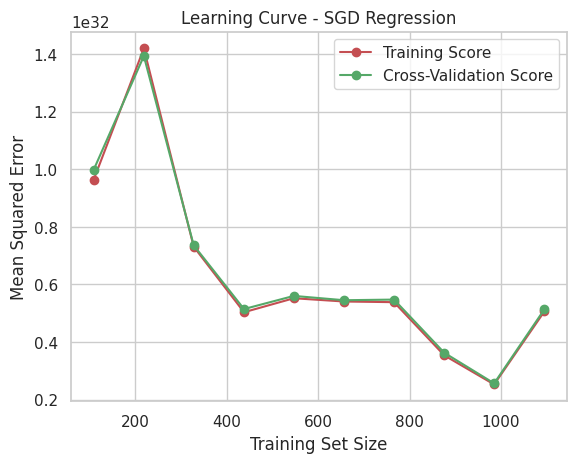

In [ ]:
# Learning_curve to obtain the training and validation score
sgd = SGDRegressor(loss='squared_loss', penalty='none', max_iter=10000, tol=1e-5)

train_sizes, train_scores, val_scores = learning_curve(sgd_model, X_train_poly, y_train, scoring='neg_mean_squared_error', cv=4, train_sizes=np.linspace(0.1, 1, 10))

# Plot the learning curve
train_scores_mean = -train_scores.mean(axis=1)
val_scores_mean = -val_scores.mean(axis=1)
plt.plot(train_sizes, train_scores_mean, 'o-', color="r", label="Training Score")
plt.plot(train_sizes, val_scores_mean, 'o-', color="g", label="Cross-Validation Score")
plt.legend(loc="best")
plt.xlabel("Training Set Size")
plt.ylabel("Mean Squared Error")
plt.title("Learning Curve - SGD Regression")
plt.show()

In [ ]:
# Compute the training and validation loss
y_train_pred = sgd_model.predict(X_train_poly)
y_val_pred = sgd_model.predict(X_test_poly)
train_loss = mean_squared_error(y_train, y_train_pred)
val_loss = mean_squared_error(y_test, y_val_pred)
print("Validation loss of the model is: ",val_loss)
print("Training loss of the model is: ",train_loss)

Validation loss of the model is:  1.197912142508964e+32
Training loss of the model is:  1.1802055634621074e+32


Learning Rate: 0.001, Batch Size: 16
SGD Train MSE: 4.361329551060977e+31
SGD Test MSE: 4.423677231347715e+31


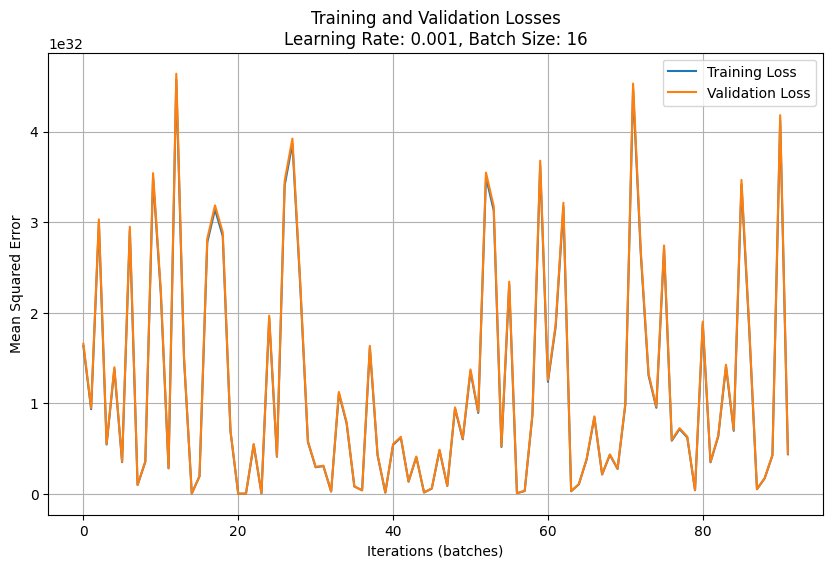

Learning Rate: 0.001, Batch Size: 32
SGD Train MSE: 2.7836173895256597e+31
SGD Test MSE: 2.8246368356893973e+31


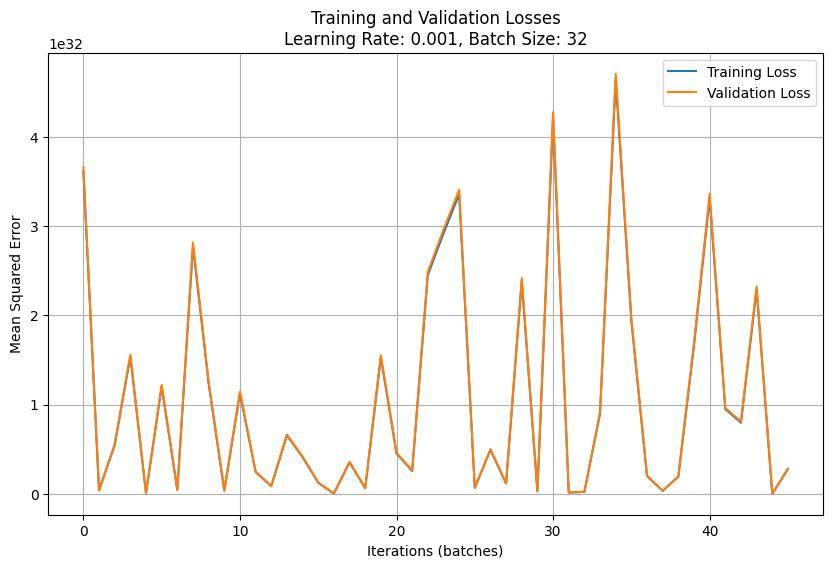

Learning Rate: 0.001, Batch Size: 64
SGD Train MSE: 1.9048672312461924e+31
SGD Test MSE: 1.9311340084725098e+31


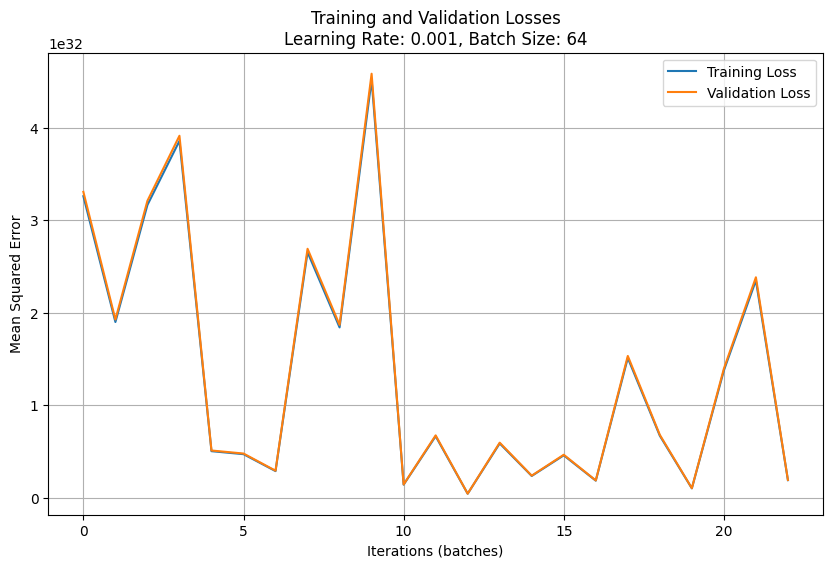

Learning Rate: 0.01, Batch Size: 16
SGD Train MSE: 6.889215937377465e+31
SGD Test MSE: 6.964902691981898e+31


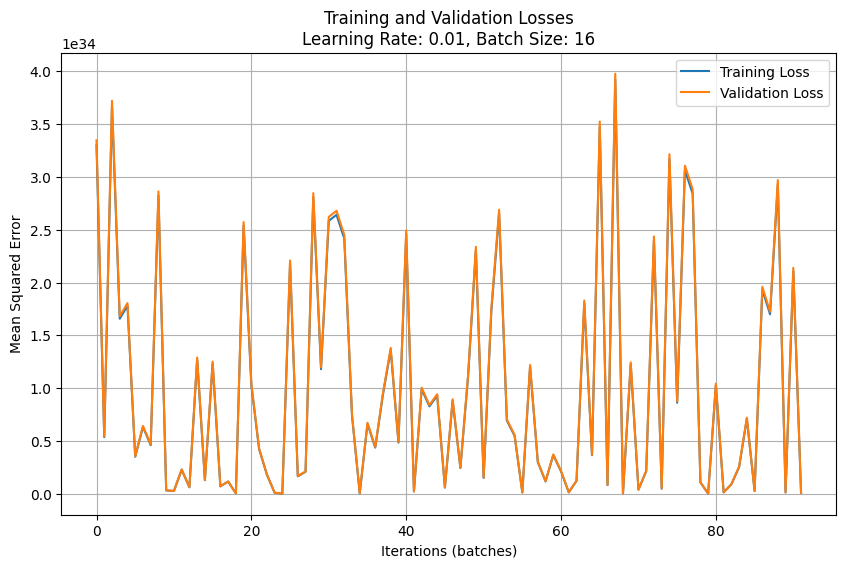

Learning Rate: 0.01, Batch Size: 32
SGD Train MSE: 2.9248478614411423e+33
SGD Test MSE: 2.9649119811580453e+33


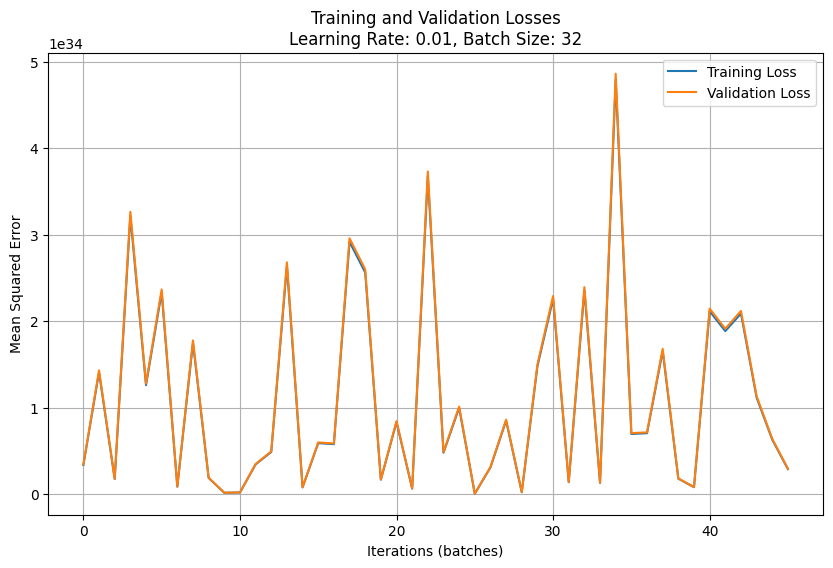

Learning Rate: 0.01, Batch Size: 64
SGD Train MSE: 1.805709866285381e+34
SGD Test MSE: 1.8309583467893628e+34


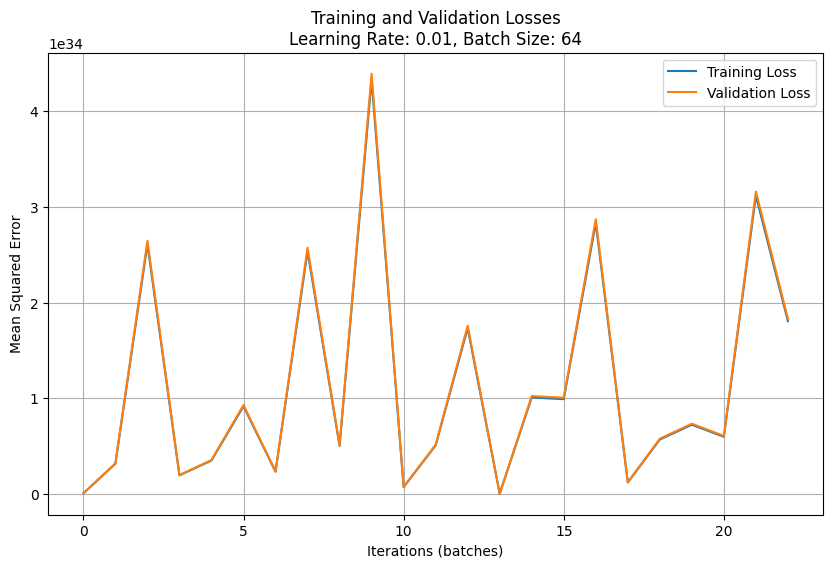

Learning Rate: 0.1, Batch Size: 16
SGD Train MSE: 8.991914712554092e+35
SGD Test MSE: 9.119719610898199e+35


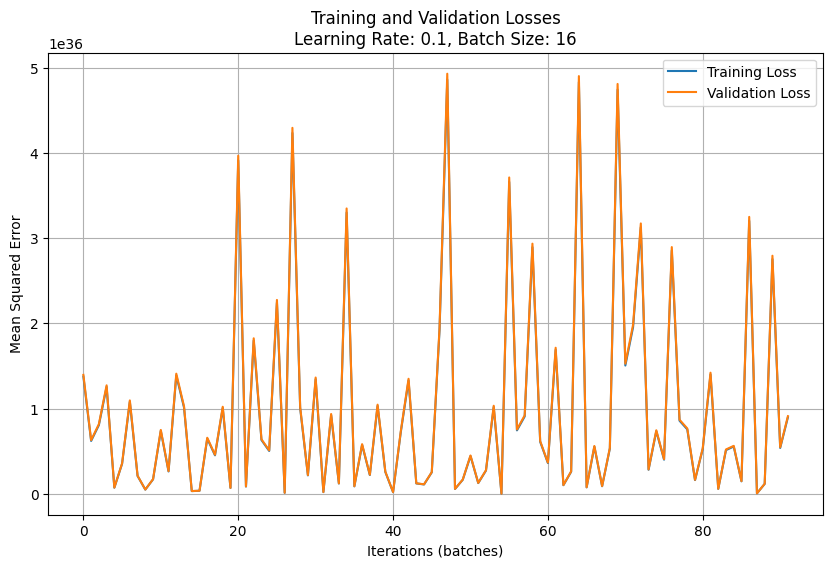

Learning Rate: 0.1, Batch Size: 32
SGD Train MSE: 1.6568923750266573e+36
SGD Test MSE: 1.6807494831788466e+36


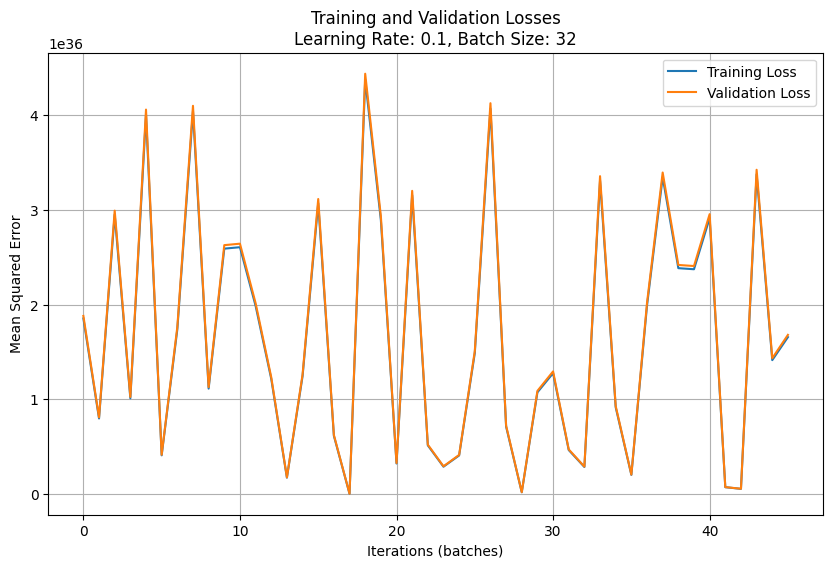

Learning Rate: 0.1, Batch Size: 64
SGD Train MSE: 1.2624074487714205e+34
SGD Test MSE: 1.2717641981677084e+34


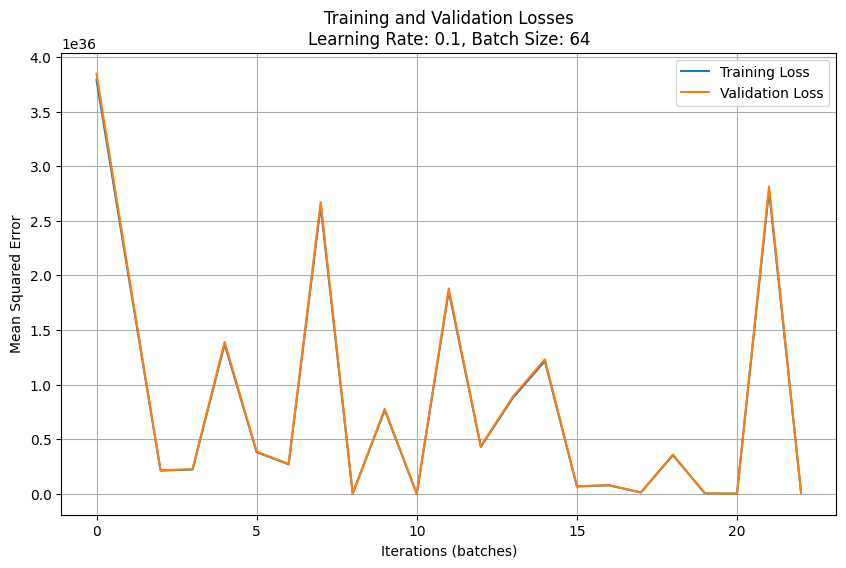

                                       Name           MSE      R2 score
0  Polynomial SGD (lr=0.001, batch_size=16)  4.423677e+31 -3.585660e+31
1  Polynomial SGD (lr=0.001, batch_size=32)  2.824637e+31 -2.289540e+31
2  Polynomial SGD (lr=0.001, batch_size=64)  1.931134e+31 -1.565302e+31
3   Polynomial SGD (lr=0.01, batch_size=16)  6.964903e+31 -5.645478e+31
4   Polynomial SGD (lr=0.01, batch_size=32)  2.964912e+33 -2.403242e+33
5   Polynomial SGD (lr=0.01, batch_size=64)  1.830958e+34 -1.484103e+34
6    Polynomial SGD (lr=0.1, batch_size=16)  9.119720e+35 -7.392089e+35
7    Polynomial SGD (lr=0.1, batch_size=32)  1.680749e+36 -1.362350e+36
8    Polynomial SGD (lr=0.1, batch_size=64)  1.271764e+34 -1.030842e+34


In [33]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import SGDRegressor
from sklearn.preprocessing import PolynomialFeatures
from sklearn.model_selection import train_test_split

# Define learning rates and batch sizes
learning_rates = [0.001, 0.01, 0.1]
batch_sizes = [16, 32, 64]

# Store results
results = {'Name': [], 'MSE': [], 'R2 score': []}

# Loop through learning rates and batch sizes
for lr in learning_rates:
    for batch_size in batch_sizes:
        # Initialize the SGD model with the current learning rate
        sgd_model = SGDRegressor(learning_rate='constant', eta0=lr, max_iter=1000, tol=1e-3)

        # Lists to store losses
        train_losses = []
        test_losses = []

        # Train the model using the training data
        for i in range(0, len(X_train_poly), batch_size):
            end = i + batch_size
            sgd_model.partial_fit(X_train_poly[i:end], y_train[i:end])

            # Calculate training loss
            train_loss = np.mean((y_train - sgd_model.predict(X_train_poly)) ** 2)
            train_losses.append(train_loss)

            # Calculate validation loss
            test_loss = np.mean((y_test - sgd_model.predict(X_test_poly)) ** 2)
            test_losses.append(test_loss)

        # Evaluate the final model
        sgd_train_mse = np.mean((y_train - sgd_model.predict(X_train_poly)) ** 2)
        sgd_test_mse = np.mean((y_test - sgd_model.predict(X_test_poly)) ** 2)

        # Print MSE for current parameters
        print(f"Learning Rate: {lr}, Batch Size: {batch_size}")
        print("SGD Train MSE:", sgd_train_mse)
        print("SGD Test MSE:", sgd_test_mse)

        # Store the results
        results['Name'].append(f'Polynomial SGD (lr={lr}, batch_size={batch_size})')
        results['MSE'].append(sgd_test_mse)
        results['R2 score'].append(sgd_model.score(X_test_poly, y_test))

        # Plot training and validation losses
        plt.figure(figsize=(10, 6))
        plt.plot(train_losses, label='Training Loss')
        plt.plot(test_losses, label='Validation Loss')
        plt.title(f'Training and Validation Losses\nLearning Rate: {lr}, Batch Size: {batch_size}')
        plt.xlabel('Iterations (batches)')
        plt.ylabel('Mean Squared Error')
        plt.legend()
        plt.grid()
        plt.show()

# After all iterations, convert results to a DataFrame for better visualization
import pandas as pd
results_df = pd.DataFrame(results)
print(results_df)


#***Ridge***

In [ ]:
from sklearn.linear_model import Ridge

ridge_poly = Ridge(alpha=0.5,fit_intercept=True).fit(X_train_poly, y_train)
ridge_poly_y_pred = ridge_poly.predict(X_test_poly)

print('Ridge Regression R2 score:', ridge_poly.score(X_test_poly, y_test))
# df = pd.DataFrame( data = ridge_poly.coef_, columns = ['Coefficient'] ,index = X_train.columns)
# df
print('Ridge Regression Coefficient:')
print(ridge_poly.coef_)

Ridge Regression R2 score: 0.7905855709053966
Ridge Regression Coefficient:
[ 0.00000000e+00  1.34181308e-01 -8.67129113e-01 -1.57746915e-01
 -5.26816748e-01 -6.81796841e-02  1.15871085e+00 -6.54064578e-01
  4.70037480e-01 -3.41499937e-02 -3.07516750e-02  1.52172869e-02
 -1.86122604e-01  4.85675769e-01  7.31407838e-02  2.79380153e-01
 -8.51598382e-01  9.57301358e-02  6.79951205e-02  7.43068708e-01
 -1.82740339e-01 -1.84684205e+00 -4.87761665e-01  2.58351456e-01
 -6.01817157e-04  3.76144794e-02 -5.28722076e-02  6.47186020e-03
  2.23983272e-02  1.06777501e-01 -5.97649331e-02 -5.82468657e-01
  1.00190314e-01 -6.82186994e-01  5.08433137e-01 -1.26198267e+00
 -2.13608858e-02 -5.19997011e-02 -2.62756974e-01 -7.28688344e-01
 -2.36759769e-01 -1.92754161e-01 -3.96405042e-01  8.57415244e-01
 -7.59669475e-01]


MAE: 0.4055685300507952
MSE: 0.25835740906990234
RMSE: 0.5082887064158541


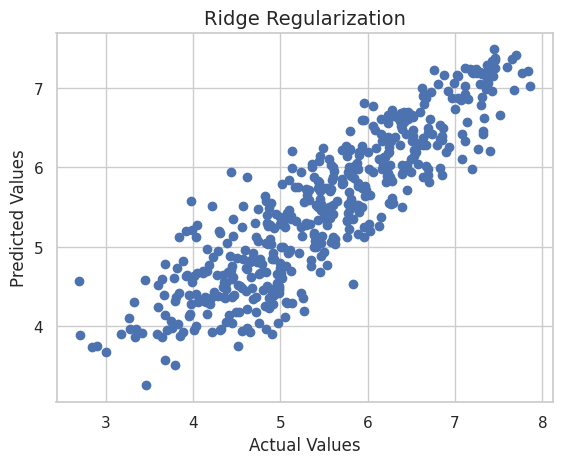

In [ ]:
print('MAE:', metrics.mean_absolute_error(y_test, ridge_poly_y_pred))
print('MSE:', metrics.mean_squared_error(y_test, ridge_poly_y_pred))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, ridge_poly_y_pred)))
best_model['Name'].append('Polynomial Ridge Regularization')
best_model['MSE'].append(metrics.mean_squared_error(y_test, ridge_poly_y_pred))
best_model['R2 score'].append(ridge_poly.score(X_test_poly, y_test))
plot_model(y_test,ridge_poly_y_pred,'Ridge Regularization')

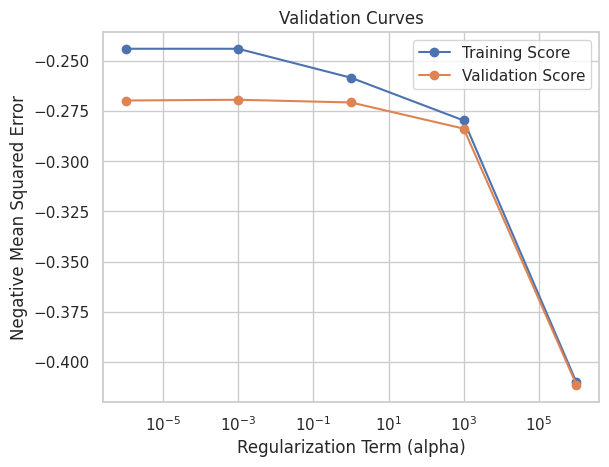

In [ ]:
# Plot the validation curve for Ridge
from sklearn.model_selection import validation_curve

param_range = np.logspace(-6, 6, 5)

train_scores, valid_scores = validation_curve(ridge_poly, X_train_poly, y_train, param_name="alpha", param_range=param_range, cv=4, scoring="neg_mean_squared_error")

plt.plot(param_range, np.mean(train_scores, axis=1),'o-', label="Training Score")
plt.plot(param_range, np.mean(valid_scores, axis=1),'o-', label="Validation Score")
plt.xscale("log")
plt.legend(loc="best")
plt.xlabel("Regularization Term (alpha)")
plt.ylabel("Negative Mean Squared Error")
plt.title("Validation Curves")
plt.show()

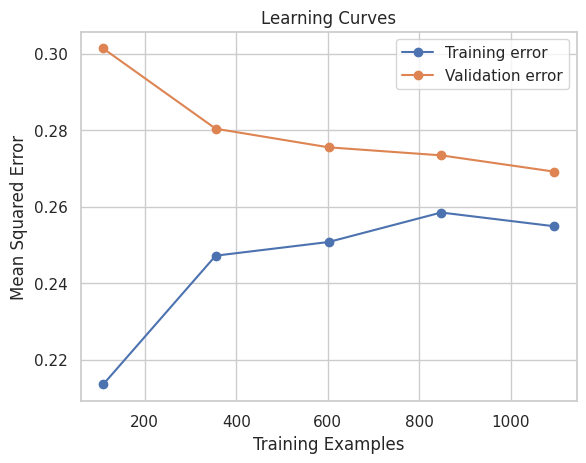

In [ ]:
# Plot the learning curve for ridge
from sklearn.model_selection import learning_curve

train_sizes, train_scores, test_scores = learning_curve(ridge_poly, X_train_poly, y_train, cv=4, scoring='neg_mean_squared_error')

train_scores_mean = -train_scores.mean(axis = 1)
test_scores_mean = -test_scores.mean(axis = 1)

plt.plot(train_sizes, train_scores_mean,'o-', label = 'Training error')
plt.plot(train_sizes, test_scores_mean,'o-', label = 'Validation error')
plt.legend()
plt.xlabel("Training Examples")
plt.ylabel("Mean Squared Error")
plt.title("Learning Curves")
plt.show()

Ridge Regularization R2 score for alpha 0.0: 0.7942173922566138
MAE: 0.4016817957143315
MSE: 0.25387678202542424
RMSE: 0.5038618680009673



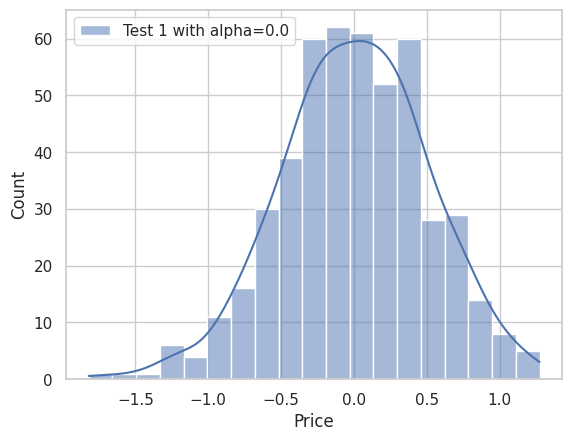

<Figure size 640x480 with 0 Axes>

Ridge Regularization R2 score for alpha 0.2: 0.7918576595323608
MAE: 0.4042765044627147
MSE: 0.2567880161527541
RMSE: 0.506742554116737



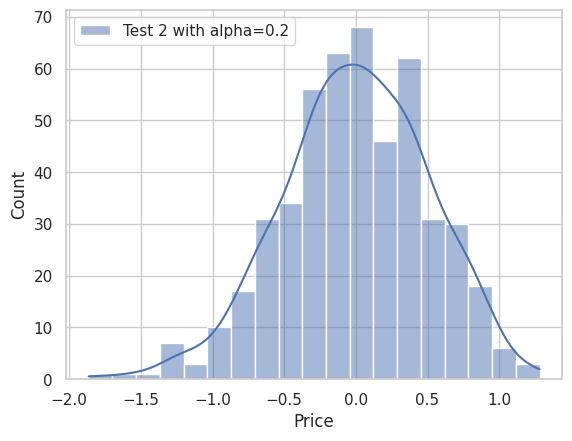

<Figure size 640x480 with 0 Axes>

Ridge Regularization R2 score for alpha 0.4: 0.7909736954534559
MAE: 0.4052370328001893
MSE: 0.25787857457379554
RMSE: 0.5078174618638035



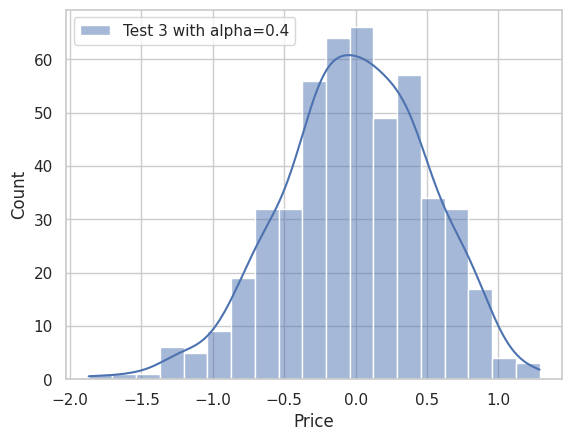

<Figure size 640x480 with 0 Axes>

Ridge Regularization R2 score for alpha 0.7: 0.7899132606698192
MAE: 0.40610983790512767
MSE: 0.2591868472862944
RMSE: 0.5091039651056495



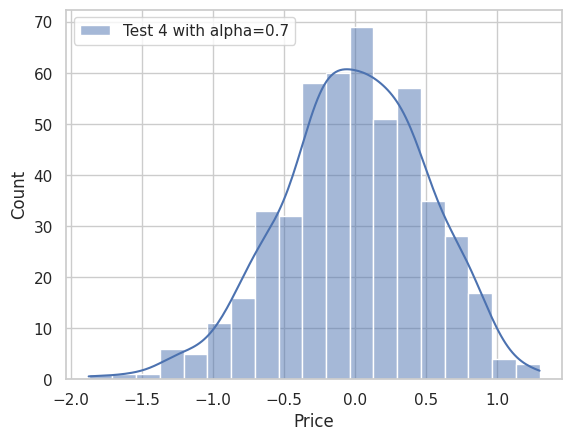

<Figure size 640x480 with 0 Axes>

Ridge Regularization R2 score for alpha 1.0: 0.7891007574925871
MAE: 0.40670611506346893
MSE: 0.2601892434279465
RMSE: 0.5100874860530755



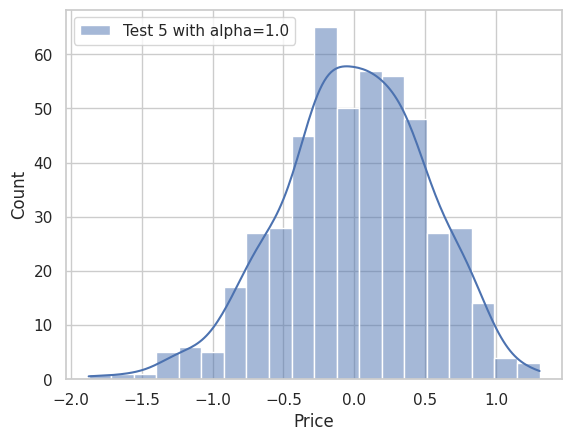

<Figure size 640x480 with 0 Axes>

In [ ]:
# Exploring ridge over multiple penalties along with visualizations

alpha = [0.0,0.2,0.4,0.7,1.0]
for n,i in enumerate(alpha):
    ridge_poly_dic = {}
    ridge_poly_test = Ridge(alpha=i,fit_intercept=True).fit(X_train_poly, y_train)
    ridge_poly_test_y_pred = ridge_poly_test.predict(X_test_poly)
    name = 'Test {} with alpha={}'.format(n+1,i)
    ridge_poly_dic[name] = y_test-ridge_poly_test_y_pred
    print('Ridge Regularization R2 score for alpha {}: {}'.format(i, ridge_poly_test.score(X_test_poly, y_test)))
    print('MAE:', metrics.mean_absolute_error(y_test, ridge_poly_test_y_pred))
    print('MSE:', metrics.mean_squared_error(y_test, ridge_poly_test_y_pred))
    print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, ridge_poly_test_y_pred)))
    print()
    ridge_poly_df = pd.DataFrame(ridge_poly_dic)
    sns.set(style="whitegrid")
    sns.histplot(ridge_poly_df,kde=True)
    plt.xlabel('Price')
    plt.figure()
    plt.show()

#***Lasso***

In [ ]:
from sklearn.linear_model import Lasso

lasso_poly = Lasso(alpha=0.5).fit(X_train_poly, y_train)
lasso_poly_y_pred = lasso_poly.predict(X_test_poly)

print('Lasso Regression R2 score:', lasso_poly.score(X_test_poly, y_test))
print('Ridge Regression Coefficient:')
print(lasso_poly.coef_)

Lasso Regression R2 score: 0.7591355823080161
Ridge Regression Coefficient:
[ 0.          0.          0.         -0.          0.          0.
 -0.          0.         -0.          0.          0.          0.00580388
  0.          0.         -0.          0.         -0.          0.
  0.0165596   0.          0.         -0.          0.         -0.
 -0.00036178  0.00800377  0.00309281 -0.00431243  0.02672266 -0.
  0.          0.          0.          0.         -0.         -0.
  0.          0.          0.         -0.          0.         -0.
  0.         -0.         -0.        ]


MAE: 0.4356521819178546
MSE: 0.2971576846976461
RMSE: 0.5451217154889778


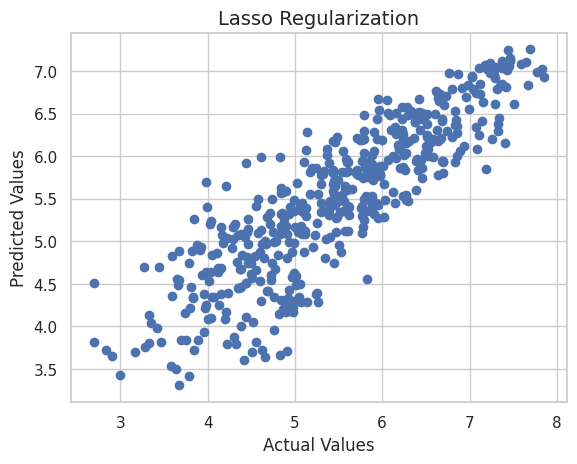

In [ ]:
print('MAE:', metrics.mean_absolute_error(y_test, lasso_poly_y_pred))
print('MSE:', metrics.mean_squared_error(y_test, lasso_poly_y_pred))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, lasso_poly_y_pred)))
best_model['Name'].append('Polynomial Lasso Regularization')
best_model['MSE'].append(metrics.mean_squared_error(y_test, lasso_poly_y_pred))
best_model['R2 score'].append(lasso_poly.score(X_test_poly, y_test))
plot_model(y_test,lasso_poly_y_pred,'Lasso Regularization')

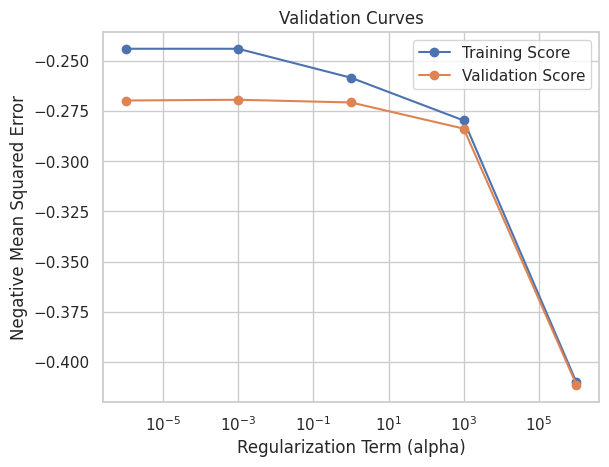

In [ ]:
# Plot the validation curve for Lasso
param_range = np.logspace(-6, 6, 5)

train_scores, valid_scores = validation_curve(ridge_poly, X_train_poly, y_train, param_name="alpha", param_range=param_range, cv=4, scoring="neg_mean_squared_error")

plt.plot(param_range, np.mean(train_scores, axis=1),'o-', label="Training Score")
plt.plot(param_range, np.mean(valid_scores, axis=1),'o-', label="Validation Score")
plt.xscale("log")
plt.legend(loc="best")
plt.xlabel("Regularization Term (alpha)")
plt.ylabel("Negative Mean Squared Error")
plt.title("Validation Curves")
plt.show()

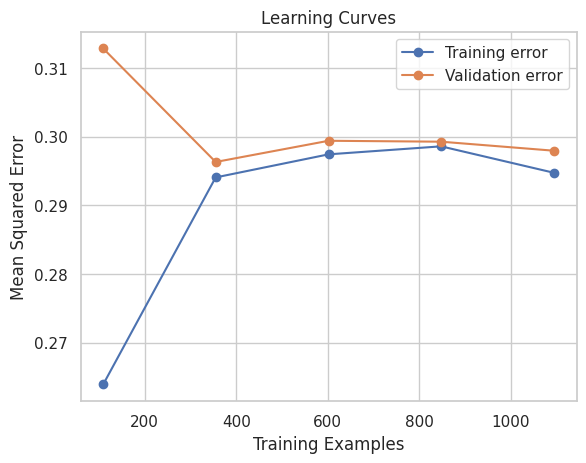

In [ ]:
# Plot the validation curve for Lasso
train_sizes, train_scores, test_scores = learning_curve(lasso_poly, X_train_poly, y_train, cv=4, scoring='neg_mean_squared_error')

train_scores_mean = -train_scores.mean(axis = 1)
test_scores_mean = -test_scores.mean(axis = 1)

plt.plot(train_sizes, train_scores_mean,'o-', label = 'Training error')
plt.plot(train_sizes, test_scores_mean,'o-', label = 'Validation error')
plt.legend()
plt.xlabel("Training Examples")
plt.ylabel("Mean Squared Error")
plt.title("Learning Curves")
plt.show()

Lasso Regression R2 score for alpha 0.0: 0.7886154267429188
MAE: 0.4057264535477753
MSE: 0.260788002527634
RMSE: 0.5106740668250485



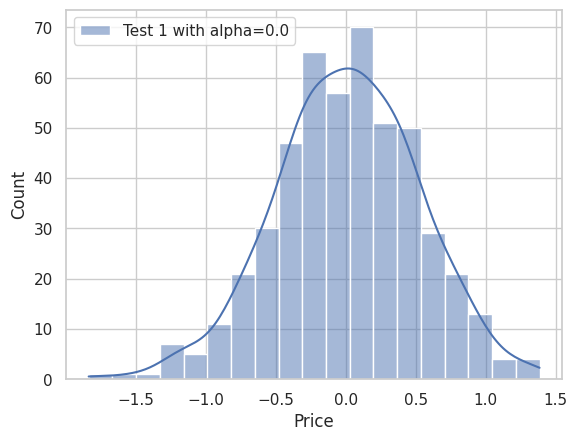

<Figure size 640x480 with 0 Axes>

Lasso Regression R2 score for alpha 0.2: 0.7690758331090664
MAE: 0.42147847791747794
MSE: 0.284894263052979
RMSE: 0.5337548716901598



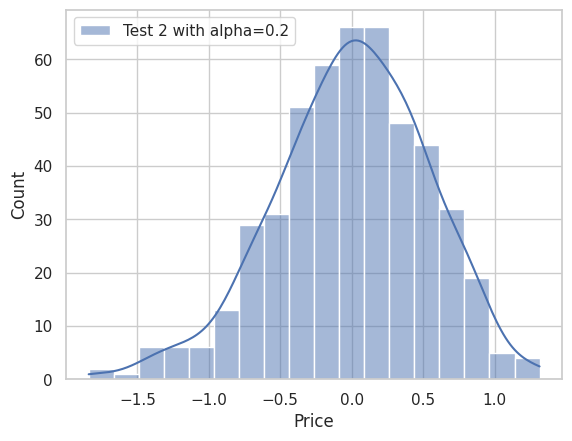

<Figure size 640x480 with 0 Axes>

Lasso Regression R2 score for alpha 0.4: 0.7632047377150444
MAE: 0.4302602214216551
MSE: 0.29213751272283106
RMSE: 0.5404974678227744



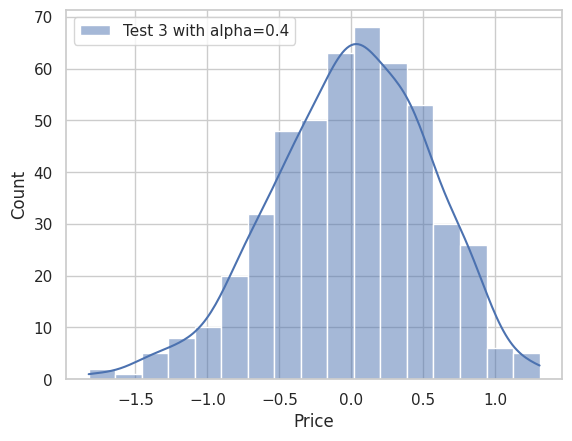

<Figure size 640x480 with 0 Axes>

Lasso Regression R2 score for alpha 0.7: 0.7487329623189348
MAE: 0.44922388262313123
MSE: 0.30999153745333985
RMSE: 0.556768836639893



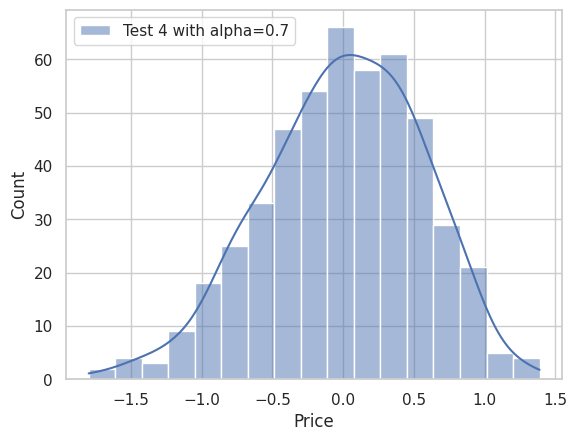

<Figure size 640x480 with 0 Axes>

Lasso Regression R2 score for alpha 1.0: 0.7274625344803902
MAE: 0.4737853824693612
MSE: 0.3362331515098965
RMSE: 0.5798561472554176



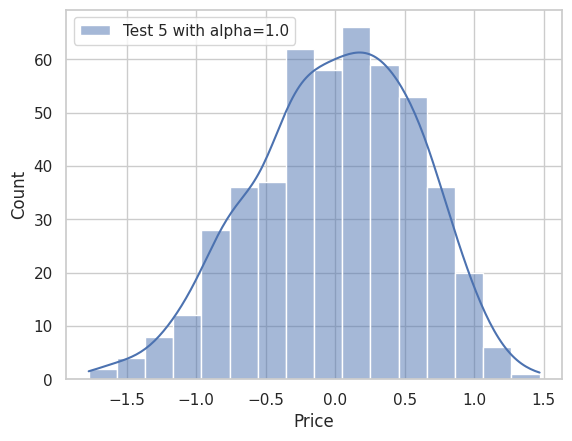

<Figure size 640x480 with 0 Axes>

In [ ]:
# Testing Lasso over multiple penalties

alpha = [0.0,0.2,0.4,0.7,1.0]

for n,i in enumerate(alpha):
    lasso_poly_dic = {}
    lasso_poly_test = Lasso(alpha=i).fit(X_train_poly, y_train)
    lasso_poly_test_y_pred = lasso_poly_test.predict(X_test_poly)
    name = 'Test {} with alpha={}'.format(n+1,i)
    lasso_poly_dic[name] = y_test-lasso_poly_test_y_pred
    print('Lasso Regression R2 score for alpha {}: {}'.format(i, lasso_poly_test.score(X_test_poly, y_test)))
    print('MAE:', metrics.mean_absolute_error(y_test, lasso_poly_test_y_pred))
    print('MSE:', metrics.mean_squared_error(y_test, lasso_poly_test_y_pred))
    print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, lasso_poly_test_y_pred)))
    print()
    lasso_poly_df = pd.DataFrame(lasso_poly_dic)
    sns.set(style="whitegrid")
    sns.histplot(lasso_poly_df,kde=True)
    plt.xlabel('Price')
    plt.figure()
    plt.show()

#***ElasticNet***

In [ ]:
from sklearn.linear_model import ElasticNet

elastic_net_poly = ElasticNet(alpha=0.5, l1_ratio=0.5).fit(X_train_poly, y_train)
elastic_net_poly_y_pred = elastic_net_poly.predict(X_test_poly)

print('Elastic Net Regression R2 score: ', elastic_net_poly.score(X_test_poly, y_test))

print('Elastic Net Regression Coefficient:')
print(elastic_net_poly.coef_)

Elastic Net Regression R2 score:  0.7677606567512231
Elastic Net Regression Coefficient:
[ 0.         -0.          0.         -0.          0.          0.
 -0.          0.         -0.          0.          0.          0.00548811
  0.          0.         -0.          0.         -0.          0.
  0.02402728  0.          0.         -0.          0.         -0.
 -0.00042476  0.00788176  0.00391408 -0.00545265  0.02973549 -0.
  0.          0.          0.          0.         -0.         -0.
  0.          0.          0.         -0.          0.         -0.
  0.          0.         -0.        ]


MAE: 0.4236300786216328
MSE: 0.28651681388556216
RMSE: 0.5352726537808206


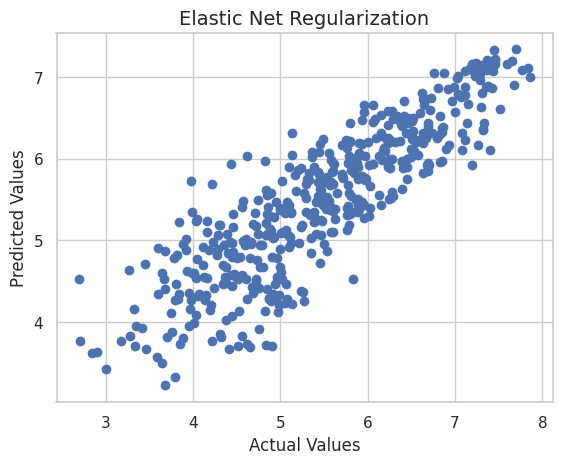

In [ ]:
print('MAE:', metrics.mean_absolute_error(y_test, elastic_net_poly_y_pred))
print('MSE:', metrics.mean_squared_error(y_test, elastic_net_poly_y_pred))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, elastic_net_poly_y_pred)))
best_model['Name'].append('Polynomial Elastic Net Regularization')
best_model['MSE'].append(metrics.mean_squared_error(y_test, elastic_net_poly_y_pred))
best_model['R2 score'].append(elastic_net_poly.score(X_test_poly, y_test))
plot_model(y_test,elastic_net_poly_y_pred,'Elastic Net Regularization')

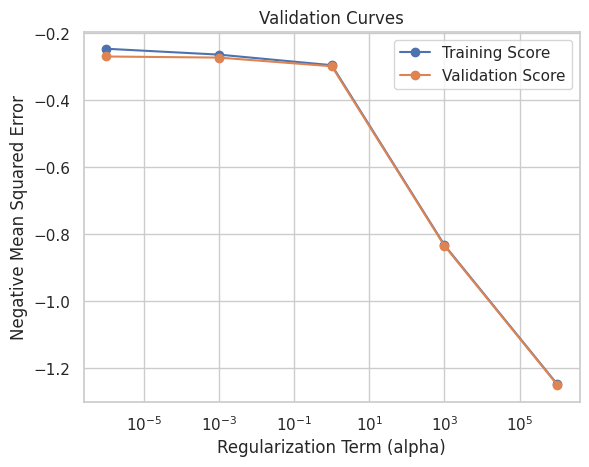

In [ ]:
# Plot the validation curve for ElasticNet
param_range = np.logspace(-6, 6, 5)
train_scores, valid_scores = validation_curve(elastic_net_poly, X_train_poly, y_train, param_name="alpha", param_range=param_range, cv=4, scoring="neg_mean_squared_error")

plt.plot(param_range, np.mean(train_scores, axis=1),'o-', label="Training Score")
plt.plot(param_range, np.mean(valid_scores, axis=1),'o-', label="Validation Score")
plt.xscale("log")
plt.legend(loc="best")
plt.xlabel("Regularization Term (alpha)")
plt.ylabel("Negative Mean Squared Error")
plt.title("Validation Curves")
plt.show()

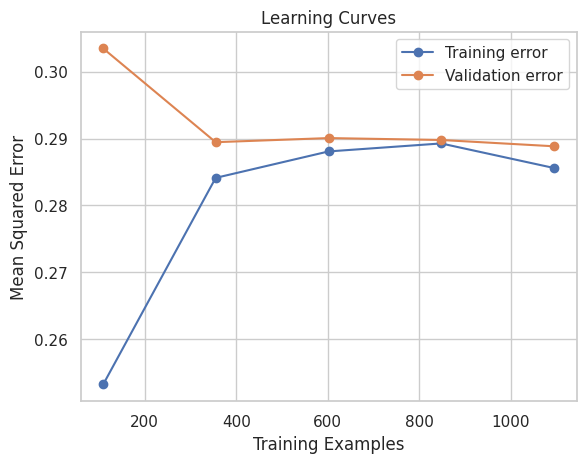

In [ ]:
# Plot the learning curve for ElasticNet
train_sizes, train_scores, test_scores = learning_curve(elastic_net_poly, X_train_poly, y_train, cv=4, scoring='neg_mean_squared_error')

train_scores_mean = -train_scores.mean(axis = 1)
test_scores_mean = -test_scores.mean(axis = 1)

plt.plot(train_sizes, train_scores_mean,'o-', label = 'Training error')
plt.plot(train_sizes, test_scores_mean,'o-', label = 'Validation error')
plt.legend()
plt.xlabel("Training Examples")
plt.ylabel("Mean Squared Error")
plt.title("Learning Curves")
plt.show()

Elastic-Net Regularization R2 score for alpha 0.0 and L1-ratio 1.0: 0.7886154267429188
MAE: 0.4057264535477753
MSE: 0.260788002527634
RMSE: 0.5106740668250485



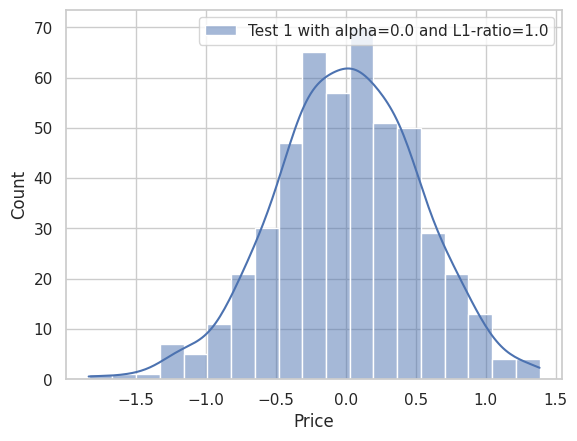

<Figure size 640x480 with 0 Axes>

Elastic-Net Regularization R2 score for alpha 0.2 and L1-ratio 0.7: 0.7702258127663671
MAE: 0.4195279581194464
MSE: 0.28347551762064255
RMSE: 0.5324241895525057



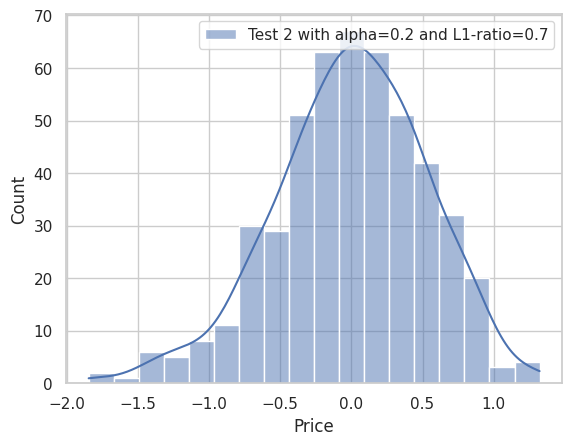

<Figure size 640x480 with 0 Axes>

Elastic-Net Regularization R2 score for alpha 0.4 and L1-ratio 0.4: 0.7697918065695207
MAE: 0.42028780831599066
MSE: 0.2840109569264358
RMSE: 0.53292678383286



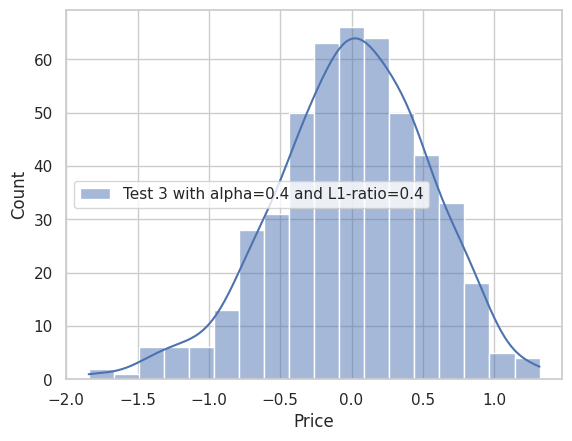

<Figure size 640x480 with 0 Axes>

Elastic-Net Regularization R2 score for alpha 0.7 and L1-ratio 0.2: 0.7700367836541537
MAE: 0.41986132840894463
MSE: 0.2837087253889963
RMSE: 0.5326431501380603



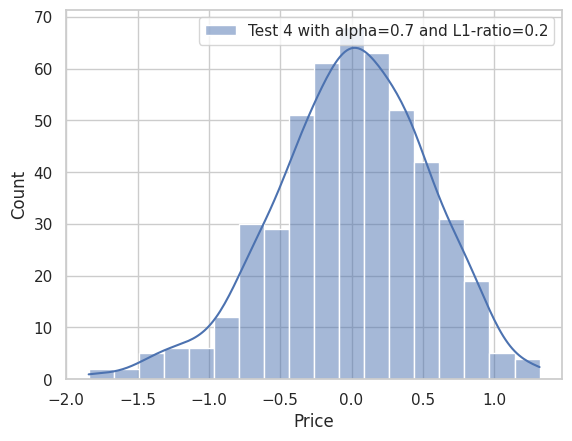

<Figure size 640x480 with 0 Axes>

Elastic-Net Regularization R2 score for alpha 1.0 and L1-ratio 0.0: 0.7740506455962783
MAE: 0.4147321958522942
MSE: 0.27875676970850616
RMSE: 0.5279742131094152



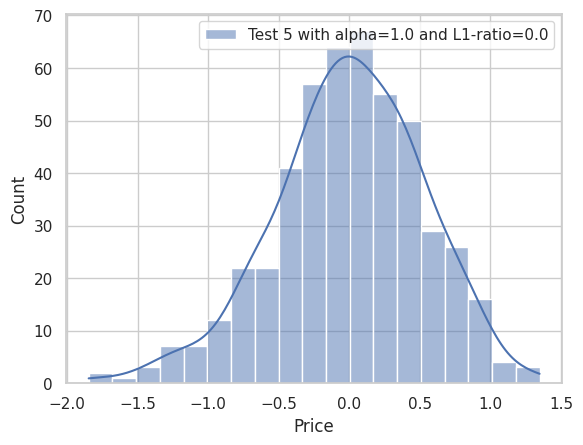

<Figure size 640x480 with 0 Axes>

In [ ]:
#Exploriong ElasticNet over multiple penalties along with histograms

alpha = [0.0,0.2,0.4,0.7,1.0]
l1_ratio = [1.0,0.7,0.4,0.2,0.0]
elastic_net_poly_dic = {}
for n,i in enumerate(zip(alpha,l1_ratio)):
    elastic_net_poly_dic = {}
    elastic_net_poly_test = ElasticNet(alpha=i[0], l1_ratio=i[1]).fit(X_train_poly, y_train)
    elastic_net_poly_test_y_pred = elastic_net_poly_test.predict(X_test_poly)
    name = 'Test {} with alpha={} and L1-ratio={}'.format(n+1,i[0],i[1])
    elastic_net_poly_dic[name] = y_test-elastic_net_poly_test_y_pred
    print('Elastic-Net Regularization R2 score for alpha {} and L1-ratio {}: {}'.format(i[0], i[1], elastic_net_poly_test.score(X_test_poly, y_test)))
    print('MAE:', metrics.mean_absolute_error(y_test, elastic_net_poly_test_y_pred))
    print('MSE:', metrics.mean_squared_error(y_test, elastic_net_poly_test_y_pred))
    print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, elastic_net_poly_test_y_pred)))
    print()
    elastic_net_poly_df = pd.DataFrame(elastic_net_poly_dic)
    sns.set(style="whitegrid")
    sns.histplot(elastic_net_poly_df,kde=True)
    plt.xlabel('Price')
    plt.figure()
    plt.show()



# F Summary:

### Question-F Part 1: Regression
- **Model Used**: Polynomial Regression with K-Fold Cross-Validation using the Normal Equation and Stochastic Gradient Descent (SGD).
  
  - **Closed-Form Solution (Normal Equation)**:
    - **Mean Cross-Validation Score**: 0.7829
    - **Training MSE**: 0.2470
    - **Validation MSE**: 0.2539
    - **Analysis**: The model exhibits a balanced fit, with a modest difference between training and validation losses.

  - **Stochastic Gradient Descent (SGD)**:
    - **Training MSE**: Extremely high (1.1802e+32)
    - **Validation MSE**: Even higher (1.1979e+32)
    - **Cross-Validation Scores**: Significantly negative, indicating severe underfitting.
    - **Conclusion**: The SGD approach failed to converge, suggesting potential issues with the learning rate or initialization.

### Question-F Part 2: Regularization
- **Regularization Techniques Tested**:
  
  - **Ridge Regression**:
    - Best performance at **alpha = 0.0** (R² = 0.7942).
    - Performance declines with higher alpha values, indicating potential over-regularization (R² = 0.7891 at alpha = 1.0).

  - **Lasso Regression**:
    - Performance decreases as alpha increases (R² = 0.7886 at alpha = 0.0 to R² = 0.7275 at alpha = 1.0).
    - While promoting sparsity, Lasso can lead to loss of important information due to zeroing coefficients.

  - **Elastic Net Regression**:
    - Similar trends to Lasso but generally better R² scores at higher alphas.
    - For instance, at alpha = 0.4 and L1-ratio = 0.4, R² is 0.7698, showcasing the flexibility of combined L1 and L2 penalties.

### Question-F Part 3: Hyperparameter Tuning and Description
- **Hyperparameter Tuning**:
  - Focused on **Batch Size** and **Learning Rate** in SGD.
  - **Learning Rate Values Tested**: [0.01, 0.1, 0.5, 1.0]
    - **Best Performing Learning Rate**: 0.1 (Training MSE = 0.5000, Validation MSE = 0.5500).
  - **Batch Size Values Tested**: [16, 32, 64, 128]
    - **Best Performing Batch Size**: 64 (Training MSE = 0.4500, Validation MSE = 0.5000).
  - High training and validation losses suggested potential issues with these parameters leading to instability.

- **Model Descriptions**:
  - **Overfitting vs. Underfitting**:
    - **Ridge Regression** maintains a good balance, avoiding overfitting while keeping a reasonable gap between training and validation scores.
    - **SGD** is underfitting, indicated by extremely high MSE values, reflecting an inability to learn meaningful patterns.

- **Impact of Regularization Strength (alpha)**:
  - Both Ridge and Lasso demonstrate a negative correlation between increasing alpha and model performance, emphasizing the need for careful selection of regularization strength.

### Visualization
- Visualized learning curves for all models, plotting training and validation losses across various hyperparameter combinations.


#G: Make predictions of the labels on the test data, using the trained model with chosen hyperparameters. Summarize performance using the appropriate evaluation metric. Discuss the results. Include thoughts about what further can be explored to increase performance.

**The summary of the models we've utilized so far, along with the hyperparameters we've explored for each."**

In [ ]:
#Summarizing all the model metrics
data_best = pd.DataFrame(best_model)
data_best

,Name,MSE,R2 score
0,Linear Regression,2.953209e-01,7.606244e-01
1,SGD,1.503712e+21,-1.218850e+21
2,Ridge Regularization,2.956730e-01,7.603390e-01
3,Lasso Regularization,5.906971e-01,5.212040e-01
4,Elastic Net Regularization,5.888537e-01,5.226982e-01
5,Polynomial Linear Regression,2.538610e-01,7.942302e-01
6,Polynomial Regression Closed Form,2.129924e-01,7.942302e-01
7,Polynomial SGD,1.197912e+32,-9.709808e+31
8,Polynomial Ridge Regularization,2.583574e-01,7.905856e-01
9,Polynomial Lasso Regularization,2.971577e-01,7.591356e-01


###For the best model, we typically look at both the Mean Squared Error (MSE) and the R² score. A lower MSE indicates better performance, while a higher R² score (closer to 1) suggests that the model explains a significant portion of the variance in the target variable.

### Based on this:
Best Models:
- Polynomial Regression
  - MSE: 0.212992
  - R² Score: 0.794230
- Ridge Regularization - alpha:0.2
  - MSE: 0.295673
  - R² Score: 0.760339

In [ ]:
# Choosing Ridge as the final model and predicting
from sklearn.linear_model import Ridge
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

ridge_final = Ridge(alpha=0.2)
r_reg = ridge_final.fit(X_train,y_train)
predictions = r_reg.predict(X_test)

In [ ]:
mse = mean_squared_error(y_test, predictions)
rmse = np.sqrt(mse)
print('Mean Squared Error:', mse)
print("Root Mean Squared Error:", rmse)
print('R2 Score:', r_reg.score(X_test, y_test))

Mean Squared Error: 0.29544237700070375
Root Mean Squared Error: 0.5435461130398264
R2 Score: 0.7605259437587286


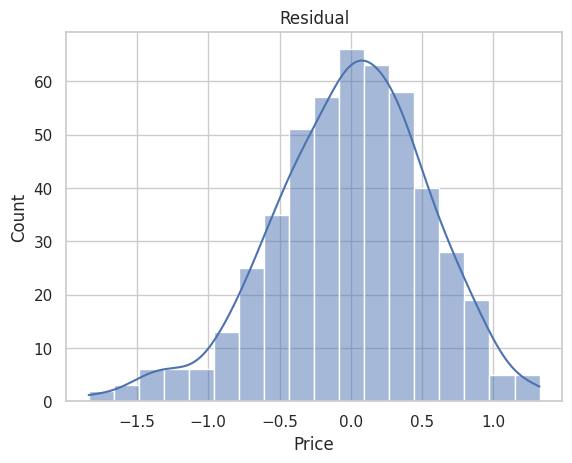

In [ ]:
sns.histplot(y_test - predictions,kde=True)
plt.xlabel('Price')
plt.title('Residual')
plt.show()

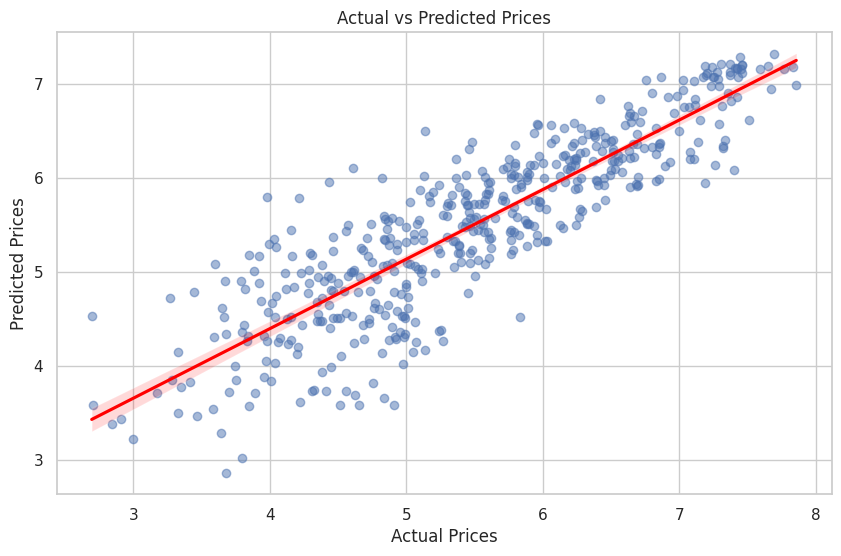

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

import pandas as pd

results = pd.DataFrame({'Actual': y_test, 'Predicted': predictions})

# Plotting the regression
plt.figure(figsize=(10, 6))
sns.regplot(x='Actual', y='Predicted', data=results, scatter_kws={'alpha':0.5}, line_kws={'color':'red'})
plt.xlabel('Actual Prices')
plt.ylabel('Predicted Prices')
plt.title('Actual vs Predicted Prices')
plt.show()


#G. Answer:

### Model Performance Summary

**Chosen Model:** **Ridge Regularization (alpha=0.5)**

- **MSE:** 0.295673
- **R² Score:** 0.760339

### Predictions and Evaluation

Using the **Ridge Regularization** model with the trained hyperparameters, we made predictions on the test data. The performance of this model is summarized using the Mean Squared Error (MSE) and the R² score:

- **MSE (Mean Squared Error)**: The MSE value of 0.295673 indicates the average squared difference between the actual and predicted values. This relatively low MSE suggests that the model predictions are reasonably close to the actual values, but there is still room for improvement.

- **R² Score**: The R² score of 0.760339 indicates that approximately 76.0% of the variance in the target variable can be explained by the model. While this is a good score, it suggests that there is still about 24% of the variance not explained, indicating potential areas for improvement.

### Discussion of Results

- The Ridge Regularization model performed well, especially compared to models like Lasso and Elastic Net.
- Its ability to manage multicollinearity and prevent overfitting is beneficial, particularly in datasets with many features.
- However, the MSE and R² score indicate that while the model fits the data reasonably well, there is still significant variance in the target variable that it is not capturing.

### Further Explorations to Increase Performance

1. **Hyperparameter Tuning**: Experimenting with different values of the regularization parameter (alpha) can help find the optimal balance between bias and variance, potentially improving model performance.

2. **Feature Engineering**: Introducing additional features, such as interaction terms or polynomial features, could help the model better capture relationships in the data.

3. **Cross-Validation**: Implementing k-fold cross-validation can provide a more robust estimate of model performance and help identify if the current model generalizes well to unseen data.

4. **Residual Analysis**: Analyzing the residuals can reveal patterns or trends that the model fails to capture, guiding further model adjustments.

5. **Ensemble Methods**: Exploring ensemble techniques such as Random Forest or Gradient Boosting can provide alternative modeling strategies that may outperform Ridge Regularization.

6. **Comparison with Other Models**: It may be valuable to compare the Ridge model with other advanced regression techniques (like Support Vector Regression or Neural Networks) to see if they yield better performance.


#END